---
# **Table of Contents**
---

1. [**Introduction**](#Section1)<br>
2. [**Problem Statement**](#Section2)<br>
3. [**Installing & Importing Libraries**](#Section3)<br>
  3.1 [**Installing Libraries**](#Section31)<br>
  3.3 [**Importing Libraries**](#Section33)<br>
4. [**Data Acquisition & Description**](#Section4)<br>
5. [**Data Pre-Profiling**](#Section5)<br>
6. [**Data Pre-Processing**](#Section6)<br>
7. [**Data Post-Profiling**](#Section7)<br>
8. [**Exploratory Data Analysis**](#Section8)<br>
9. [**Splitting data into training and test**](#Section9)</br>
10. [**Scaling**](#Section10)</br>
11. [**Model Building**](#Section11)</br>
12. [**Predicting Unseen Data**](#Section12)</br>
13. [**Preparing Submission File**](#Section13)</br>
14. [**Summary**](#Section14)</br>


---
<a name = Section1></a>
# **1. Introduction**

---
**Company Introduction** - **Agip Oil Company Limited (AOCL)**

Your client for this project is a is a Oil company - Agip Oil Company Limited (AOCL)
- They are one of the largest Oil Company. By 2017 they had daily production of 25.451 million
BOE(barrels of oil equivalent).
- In 2017, this was approximately 13% of world production, which is less than several of the
largest state-owned petroleum companies.
- They want to increase their production in order to compete with larger oil companies.
- They want to automate the process of keeping track of the state and trend of production using
previous Crude Oil Data.
- Their research and development teams are trying to understand properties of the previous years
Crude Oil data so that they can use it to increase their production.

**Current Scenario:**
- Determining state of production as growth or decay, based upon historical crude oil data.
- The traditional crude oil production state prediction methods are based on statistical analysis,
extracting effective information from historical data and making reasonable judgements for
classification.
- Statistics based models use a sample of data to perform classification, so these cannot provide
accurate results.
- However, designing a computer program to do this turns out to be a bit trickier.

---
<a name = Section2></a>
# **2. Problem Statement**

---
The company suffers from the following problems:

- The current process is a manual classification of production state using statistical methods.
- This is very tedious and time-consuming as it needs to be repeated for every new customer.

The company has hired you as data science consultants.

They want to automate the process of predicting the production state using properties of the crude
oil trend rather than doing this manual work.

### Your Role:
- You are given previous year Crude Oil Production data.
- Your task is to build a classification model using the dataset.
- Because there was no machine learning model for this problem in the company, you don’t have a
quantifiable win condition. You need to build the best possible model.

###Project Deliverable:
- Deliverable:**CrudeOil Production will grow or not.**
- Machine Learning Task: **Classification**
- Target Variable: **activity**
- Win Condition: N/A (best possible model)

###Evaluation Metric:
- The model evaluation will be based on the **F1 Score**.


---
<a name = Section3></a>
# **3. Installing and Importing Libraries**

---



---
<a name = Section31></a>
## **3.1  Installing Libraries**

---

In [1]:
!pip install -q datascience                   # Package that is required by pandas profiling
!pip install -q pandas-profiling              # Library to generate basic statistics about data
!pip install -q --upgrade pandas-profiling

     |████████████████████████████████| 69 kB 6.7 MB/s 
     |████████████████████████████████| 262 kB 12.1 MB/s 
     |████████████████████████████████| 596 kB 43.9 MB/s 
     |████████████████████████████████| 102 kB 12.6 MB/s 
     |████████████████████████████████| 11.1 MB 44.5 MB/s 
     |████████████████████████████████| 690 kB 33.0 MB/s 
     |████████████████████████████████| 4.7 MB 17.8 MB/s 
     |████████████████████████████████| 63 kB 1.0 MB/s 
     |████████████████████████████████| 812 kB 44.1 MB/s 
     |████████████████████████████████| 38.1 MB 1.8 MB/s 
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
google-colab 1.0.0 requires requests~=2.23.0, but you have requests 2.27.1 which is incompatible.
albumentations 0.1.12 requires imgaug<0.2.7,>=0.2.5, but you have imgaug 0.2.9 which is incompatible.


In [2]:
pip install MarkupSafe==2.0.1

  Attempting uninstall: MarkupSafe
    Found existing installation: MarkupSafe 2.1.1
    Uninstalling MarkupSafe-2.1.1:
      Successfully uninstalled MarkupSafe-2.1.1
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
pandas-profiling 3.2.0 requires markupsafe~=2.1.1, but you have markupsafe 2.0.1 which is incompatible.


---
<a name = Section32></a>
# **3.2 Importing Libraries**

---

In [3]:
#-------------------------------------------------------------------------------------------------------------------------------
import pandas as pd                                                 # Importing for panel data analysis
pd.set_option('display.max_columns', None)                          # Unfolding hidden features if the cardinality is high
pd.set_option('display.max_colwidth', None)                         # Unfolding the max feature width for better clearity
pd.set_option('display.max_rows', None)                             # Unfolding hidden data points if the cardinality is high
pd.set_option('mode.chained_assignment', None)                      # Removing restriction over chained assignments operations
pd.set_option('display.float_format', lambda x: '%.5f' % x)         # To suppress scientific notation over exponential values
#-------------------------------------------------------------------------------------------------------------------------------
import numpy as np                                                  # Importing package numpys (For Numerical Python)
#-------------------------------------------------------------------------------------------------------------------------------
import matplotlib.pyplot as plt                                     # Importing pyplot interface using matplotlib
import seaborn as sns                                               # Importin seaborm library for interactive visualization
import plotly.graph_objs as go                                      # Importing plotly for interactive visualizations
%matplotlib inline
#-------------------------------------------------------------------------------------------------------------------------------



---
<a name = Section4></a>
# **4. Data Acquisition and Description**

---

- This database was created to predict the Crude Oil production’s trend based on the previous year
Crude Oil data.
- The column Target is also present in the dataset which has two values 1 and 0 corresponding to
whether production will grow or not.
- This is the data that we have to **predict for future samples.**

The dataset is divided into two parts: Train and Test
**Train Set:**

| Records |Features|Target Variable|
|--|--|--|
|**7619**|**124**|**Target**|

**Test Set:**

|Records|Features|Predicted Variable|
|--|--|--|
|**2540**|**123**|**Target**|

|***ID***|****Feature****|****Description****|
|:---|:--|:--|
|01| Id | Unique Id |
|02| month | Selected Months|
|03| Country | Countries(76 in Total)|
|04| 1_diffClosing stocks(kmt) | Closing Stocks for one Month|
|05| 1_diffExports(kmt) | Exports for one Month|
|06| 1_diffImports(kmt) | Imports for one Month|
|07| 1_diffRefinery intake | Refinery Intake for one Month|
|08| 1_diffWTI | West texas Intermediate Price for one Month|
|09| 1_diffSumClosing stocks(kmt) | Sum Closing Stocks for one Month|
|10| 1_diffSumExports(kmt) | Sum Exports for one Month|
|11| 1_diffSumImports(kmt) | Sum Import for one Month|
|12| 1_diffSumImports(kmt) | Sum Production one Month|
|13| 1_diffSumImports(kmt) | Sum Refinery Intake|
|114| 12_diffClosing stocks(kmt) | Closing Stocks for 12 Months|
|123|12_diffSumImports(kmt) | Sum Refinery Intake| | Sum Refinery Intake|
|124| Target | The label for the crude oil data (whether production will grow or not)|

##Fetching the data

In [4]:
df_train = pd.read_csv("/content/drive/MyDrive/Oil_train.csv")

In [5]:
df_train.head(5)

,ID,month,country,1_diffClosing stocks(kmt),1_diffExports(kmt),1_diffImports(kmt),1_diffRefinery intake(kmt),1_diffWTI,1_diffSumClosing stocks(kmt),1_diffSumExports(kmt),1_diffSumImports(kmt),1_diffSumProduction(kmt),1_diffSumRefinery intake(kmt),2_diffClosing stocks(kmt),2_diffExports(kmt),2_diffImports(kmt),2_diffRefinery intake(kmt),2_diffWTI,2_diffSumClosing stocks(kmt),2_diffSumExports(kmt),2_diffSumImports(kmt),2_diffSumProduction(kmt),2_diffSumRefinery intake(kmt),3_diffClosing stocks(kmt),3_diffExports(kmt),3_diffImports(kmt),3_diffRefinery intake(kmt),3_diffWTI,3_diffSumClosing stocks(kmt),3_diffSumExports(kmt),3_diffSumImports(kmt),3_diffSumProduction(kmt),3_diffSumRefinery intake(kmt),4_diffClosing stocks(kmt),4_diffExports(kmt),4_diffImports(kmt),4_diffRefinery intake(kmt),4_diffWTI,4_diffSumClosing stocks(kmt),4_diffSumExports(kmt),4_diffSumImports(kmt),4_diffSumProduction(kmt),4_diffSumRefinery intake(kmt),5_diffClosing stocks(kmt),5_diffExports(kmt),5_diffImports(kmt),5_diffRefinery intake(kmt),5_diffWTI,5_diffSumClosing stocks(kmt),5_diffSumExports(kmt),5_diffSumImports(kmt),5_diffSumProduction(kmt),5_diffSumRefinery intake(kmt),6_diffClosing stocks(kmt),6_diffExports(kmt),6_diffImports(kmt),6_diffRefinery intake(kmt),6_diffWTI,6_diffSumClosing stocks(kmt),6_diffSumExports(kmt),6_diffSumImports(kmt),6_diffSumProduction(kmt),6_diffSumRefinery intake(kmt),7_diffClosing stocks(kmt),7_diffExports(kmt),7_diffImports(kmt),7_diffRefinery intake(kmt),7_diffWTI,7_diffSumClosing stocks(kmt),7_diffSumExports(kmt),7_diffSumImports(kmt),7_diffSumProduction(kmt),7_diffSumRefinery intake(kmt),8_diffClosing stocks(kmt),8_diffExports(kmt),8_diffImports(kmt),8_diffRefinery intake(kmt),8_diffWTI,8_diffSumClosing stocks(kmt),8_diffSumExports(kmt),8_diffSumImports(kmt),8_diffSumProduction(kmt),8_diffSumRefinery intake(kmt),9_diffClosing stocks(kmt),9_diffExports(kmt),9_diffImports(kmt),9_diffRefinery intake(kmt),9_diffWTI,9_diffSumClosing stocks(kmt),9_diffSumExports(kmt),9_diffSumImports(kmt),9_diffSumProduction(kmt),9_diffSumRefinery intake(kmt),10_diffClosing stocks(kmt),10_diffExports(kmt),10_diffImports(kmt),10_diffRefinery intake(kmt),10_diffWTI,10_diffSumClosing stocks(kmt),10_diffSumExports(kmt),10_diffSumImports(kmt),10_diffSumProduction(kmt),10_diffSumRefinery intake(kmt),11_diffClosing stocks(kmt),11_diffExports(kmt),11_diffImports(kmt),11_diffRefinery intake(kmt),11_diffWTI,11_diffSumClosing stocks(kmt),11_diffSumExports(kmt),11_diffSumImports(kmt),11_diffSumProduction(kmt),11_diffSumRefinery intake(kmt),12_diffClosing stocks(kmt),12_diffExports(kmt),12_diffImports(kmt),12_diffRefinery intake(kmt),12_diffWTI,12_diffSumClosing stocks(kmt),12_diffSumExports(kmt),12_diffSumImports(kmt),12_diffSumProduction(kmt),12_diffSumRefinery intake(kmt),Target
0,ID04188,6,46,0.00000,0.00000,0.00000,0.00000,2.62000,7069.83100,-3216.16550,3291.57120,-9977.56020,-5846.32370,0.00000,0.00000,0.00000,0.00000,-12.07000,-2652.68040,2165.71190,-4491.30560,8211.12760,5942.25350,0.00000,0.00000,0.00000,0.00000,1.59000,-1421.26440,-6194.26740,7706.77090,-10581.66490,2893.44310,0.00000,0.00000,0.00000,0.00000,3.26000,1116.37700,2926.93050,3217.16620,10352.59080,8773.11260,0.00000,0.00000,0.00000,0.00000,-6.92000,2099.99960,-2666.44460,-3956.18350,-162.94300,468.76990,0.00000,0.00000,0.00000,0.00000,8.02000,-4942.91610,762.33730,-6657.26390,-7457.74080,-10467.55000,0.00000,0.00000,0.00000,0.00000,1.50000,4572.18690,219.28130,-3695.83430,10071.98490,-5463.09630,0.00000,0.00000,0.00000,0.00000,2.67000,-5302.67130,3348.43250,3339.95610,-8501.10130,4832.34610,0.00000,0.00000,0.00000,0.00000,7.26000,-2856.93240,8578.28910,5797.08950,11567.34230,11558.15830,0.00000,0.00000,0.00000,0.00000,-0.39000,-1368.62050,-7199.75080,992.10460,1026.50450,-37.17610,0.00000,0.00000,0.00000,0.00000,6.11000,-1109.42470,-8571.01660,-21553.75470,-27304.69510,-34199.31000,0.00000,0.00000,0.00000,0.00000,9.09000,9341.68180,7186.39750,22441.05010,21649.35430,27000.54460,0
1,I

## Data Analysis




In [6]:
df_train.shape

(7619, 124)

In [7]:
df_train.info(all)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7619 entries, 0 to 7618
Data columns (total 124 columns):
 #    Column                          Dtype  
---   ------                          -----  
 0    ID                              object 
 1    month                           int64  
 2    country                         int64  
 3    1_diffClosing stocks(kmt)       float64
 4    1_diffExports(kmt)              float64
 5    1_diffImports(kmt)              float64
 6    1_diffRefinery intake(kmt)      float64
 7    1_diffWTI                       float64
 8    1_diffSumClosing stocks(kmt)    float64
 9    1_diffSumExports(kmt)           float64
 10   1_diffSumImports(kmt)           float64
 11   1_diffSumProduction(kmt)        float64
 12   1_diffSumRefinery intake(kmt)   float64
 13   2_diffClosing stocks(kmt)       float64
 14   2_diffExports(kmt)              float64
 15   2_diffImports(kmt)              float64
 16   2_diffRefinery intake(kmt)      float64
 17   2_diffWTI   

In [8]:
df_train.describe()

,month,country,1_diffClosing stocks(kmt),1_diffExports(kmt),1_diffImports(kmt),1_diffRefinery intake(kmt),1_diffWTI,1_diffSumClosing stocks(kmt),1_diffSumExports(kmt),1_diffSumImports(kmt),1_diffSumProduction(kmt),1_diffSumRefinery intake(kmt),2_diffClosing stocks(kmt),2_diffExports(kmt),2_diffImports(kmt),2_diffRefinery intake(kmt),2_diffWTI,2_diffSumClosing stocks(kmt),2_diffSumExports(kmt),2_diffSumImports(kmt),2_diffSumProduction(kmt),2_diffSumRefinery intake(kmt),3_diffClosing stocks(kmt),3_diffExports(kmt),3_diffImports(kmt),3_diffRefinery intake(kmt),3_diffWTI,3_diffSumClosing stocks(kmt),3_diffSumExports(kmt),3_diffSumImports(kmt),3_diffSumProduction(kmt),3_diffSumRefinery intake(kmt),4_diffClosing stocks(kmt),4_diffExports(kmt),4_diffImports(kmt),4_diffRefinery intake(kmt),4_diffWTI,4_diffSumClosing stocks(kmt),4_diffSumExports(kmt),4_diffSumImports(kmt),4_diffSumProduction(kmt),4_diffSumRefinery intake(kmt),5_diffClosing stocks(kmt),5_diffExports(kmt),5_diffImports(kmt),5_diffRefinery intake(kmt),5_diffWTI,5_diffSumClosing stocks(kmt),5_diffSumExports(kmt),5_diffSumImports(kmt),5_diffSumProduction(kmt),5_diffSumRefinery intake(kmt),6_diffClosing stocks(kmt),6_diffExports(kmt),6_diffImports(kmt),6_diffRefinery intake(kmt),6_diffWTI,6_diffSumClosing stocks(kmt),6_diffSumExports(kmt),6_diffSumImports(kmt),6_diffSumProduction(kmt),6_diffSumRefinery intake(kmt),7_diffClosing stocks(kmt),7_diffExports(kmt),7_diffImports(kmt),7_diffRefinery intake(kmt),7_diffWTI,7_diffSumClosing stocks(kmt),7_diffSumExports(kmt),7_diffSumImports(kmt),7_diffSumProduction(kmt),7_diffSumRefinery intake(kmt),8_diffClosing stocks(kmt),8_diffExports(kmt),8_diffImports(kmt),8_diffRefinery intake(kmt),8_diffWTI,8_diffSumClosing stocks(kmt),8_diffSumExports(kmt),8_diffSumImports(kmt),8_diffSumProduction(kmt),8_diffSumRefinery intake(kmt),9_diffClosing stocks(kmt),9_diffExports(kmt),9_diffImports(kmt),9_diffRefinery intake(kmt),9_diffWTI,9_diffSumClosing stocks(kmt),9_diffSumExports(kmt),9_diffSumImports(kmt),9_diffSumProduction(kmt),9_diffSumRefinery intake(kmt),10_diffClosing stocks(kmt),10_diffExports(kmt),10_diffImports(kmt),10_diffRefinery intake(kmt),10_diffWTI,10_diffSumClosing stocks(kmt),10_diffSumExports(kmt),10_diffSumImports(kmt),10_diffSumProduction(kmt),10_diffSumRefinery intake(kmt),11_diffClosing stocks(kmt),11_diffExports(kmt),11_diffImports(kmt),11_diffRefinery intake(kmt),11_diffWTI,11_diffSumClosing stocks(kmt),11_diffSumExports(kmt),11_diffSumImports(kmt),11_diffSumProduction(kmt),11_diffSumRefinery intake(kmt),12_diffClosing stocks(kmt),12_diffExports(kmt),12_diffImports(kmt),12_diffRefinery intake(kmt),12_diffWTI,12_diffSumClosing stocks(kmt),12_diffSumExports(kmt),12_diffSumImports(kmt),12_diffSumProduction(kmt),12_diffSumRefinery intake(kmt),Target
count,7619.00000,7619.00000,7421.00000,7619.00000,7505.00000,7619.00000,7619.00000,7619.00000,7619.00000,7619.00000,7619.00000,7619.00000,7423.00000,7619.00000,7508.00000,7619.00000,7619.00000,7619.00000,7619.00000,7619.00000,7619.00000,7619.00000,7427.00000,7619.00000,7510.00000,7619.00000,7619.00000,7619.00000,7619.00000,7619.00000,7619.00000,7619.00000,7429.00000,7619.00000,7512.00000,7619.00000,7619.00000,7619.00000,7619.00000,7619.00000,7619.00000,7619.00000,7433.00000,7619.00000,7514.00000,7619.00000,7619.00000,7619.00000,7619.00000,7619.00000,7619.00000,7619.00000,7440.00000,7619.00000,7517.00000,7619.00000,7619.00000,7619.00000,7619.00000,7619.00000,7619.00000,7619.00000,7440.00000,7619.00000,7520.00000,7619.00000,7619.00000,7619.00000,7619.00000,7619.00000,7619.00000,7619.00000,7439.00000,7619.00000,7524.00000,7619.00000,7619.00000,7619.00000,7619.00000,7619.00000,7619.00000,7619.00000,7440.00000,7619.00000,7526.00000,7619.00000,7619.00000,7619.00000,7619.00000,7619.00000,7619.00000,7619.00000,7442.00000,7619.00000,7528.00000,7619.00000,7619.00000,7619.00000,7619.00000,7619.00000,7619.00000,7619.00000,7443.00000,7619.00000,7527.00000,7619.00000,7619.00000,7619.00000,7619.0

---
<a name = Section5></a>
# **5. Data Pre-Profiling**

---


In [9]:
# To install
!pip install sweetviz
# Load it
import sweetviz as sv


     |████████████████████████████████| 15.1 MB 31.8 MB/s 


In [ ]:
#Use it
analysis = sv.analyze(df_train)
analysis.show_html('crude_oil_train.html')

                                             |          | [  0%]   00:00 -> (? left)

/usr/local/lib/python3.7/dist-packages/sweetviz/graph_associations.py:219: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  new_dataframe[feature] = pd.Series(dtype=float)


Report crude_oil_train.html was generated! NOTEBOOK/COLAB USERS: the web browser MAY not pop up, regardless, the report IS saved in your notebook/colab files.


In [ ]:
analysis.show_notebook()

---
<a name = Section6></a>
# **6. Data Pre-Processing**

---

## Understanding Correlations

In [10]:
df_train.corr()

,month,country,1_diffClosing stocks(kmt),1_diffExports(kmt),1_diffImports(kmt),1_diffRefinery intake(kmt),1_diffWTI,1_diffSumClosing stocks(kmt),1_diffSumExports(kmt),1_diffSumImports(kmt),1_diffSumProduction(kmt),1_diffSumRefinery intake(kmt),2_diffClosing stocks(kmt),2_diffExports(kmt),2_diffImports(kmt),2_diffRefinery intake(kmt),2_diffWTI,2_diffSumClosing stocks(kmt),2_diffSumExports(kmt),2_diffSumImports(kmt),2_diffSumProduction(kmt),2_diffSumRefinery intake(kmt),3_diffClosing stocks(kmt),3_diffExports(kmt),3_diffImports(kmt),3_diffRefinery intake(kmt),3_diffWTI,3_diffSumClosing stocks(kmt),3_diffSumExports(kmt),3_diffSumImports(kmt),3_diffSumProduction(kmt),3_diffSumRefinery intake(kmt),4_diffClosing stocks(kmt),4_diffExports(kmt),4_diffImports(kmt),4_diffRefinery intake(kmt),4_diffWTI,4_diffSumClosing stocks(kmt),4_diffSumExports(kmt),4_diffSumImports(kmt),4_diffSumProduction(kmt),4_diffSumRefinery intake(kmt),5_diffClosing stocks(kmt),5_diffExports(kmt),5_diffImports(kmt),5_diffRefinery intake(kmt),5_diffWTI,5_diffSumClosing stocks(kmt),5_diffSumExports(kmt),5_diffSumImports(kmt),5_diffSumProduction(kmt),5_diffSumRefinery intake(kmt),6_diffClosing stocks(kmt),6_diffExports(kmt),6_diffImports(kmt),6_diffRefinery intake(kmt),6_diffWTI,6_diffSumClosing stocks(kmt),6_diffSumExports(kmt),6_diffSumImports(kmt),6_diffSumProduction(kmt),6_diffSumRefinery intake(kmt),7_diffClosing stocks(kmt),7_diffExports(kmt),7_diffImports(kmt),7_diffRefinery intake(kmt),7_diffWTI,7_diffSumClosing stocks(kmt),7_diffSumExports(kmt),7_diffSumImports(kmt),7_diffSumProduction(kmt),7_diffSumRefinery intake(kmt),8_diffClosing stocks(kmt),8_diffExports(kmt),8_diffImports(kmt),8_diffRefinery intake(kmt),8_diffWTI,8_diffSumClosing stocks(kmt),8_diffSumExports(kmt),8_diffSumImports(kmt),8_diffSumProduction(kmt),8_diffSumRefinery intake(kmt),9_diffClosing stocks(kmt),9_diffExports(kmt),9_diffImports(kmt),9_diffRefinery intake(kmt),9_diffWTI,9_diffSumClosing stocks(kmt),9_diffSumExports(kmt),9_diffSumImports(kmt),9_diffSumProduction(kmt),9_diffSumRefinery intake(kmt),10_diffClosing stocks(kmt),10_diffExports(kmt),10_diffImports(kmt),10_diffRefinery intake(kmt),10_diffWTI,10_diffSumClosing stocks(kmt),10_diffSumExports(kmt),10_diffSumImports(kmt),10_diffSumProduction(kmt),10_diffSumRefinery intake(kmt),11_diffClosing stocks(kmt),11_diffExports(kmt),11_diffImports(kmt),11_diffRefinery intake(kmt),11_diffWTI,11_diffSumClosing stocks(kmt),11_diffSumExports(kmt),11_diffSumImports(kmt),11_diffSumProduction(kmt),11_diffSumRefinery intake(kmt),12_diffClosing stocks(kmt),12_diffExports(kmt),12_diffImports(kmt),12_diffRefinery intake(kmt),12_diffWTI,12_diffSumClosing stocks(kmt),12_diffSumExports(kmt),12_diffSumImports(kmt),12_diffSumProduction(kmt),12_diffSumRefinery intake(kmt),Target
month,1.00000,0.00497,0.01226,0.01974,0.00078,0.00903,-0.09487,0.04841,0.05702,-0.00443,0.12626,0.12111,-0.01523,-0.01947,-0.01328,-0.02045,-0.14465,0.04532,-0.08538,-0.07049,-0.07631,0.02919,-0.01065,0.04958,0.01817,0.00405,-0.12240,-0.13440,0.20470,0.11316,0.09122,0.10186,-0.01463,0.01051,0.01951,-0.00148,-0.12666,-0.08281,0.07045,0.10188,0.11393,-0.00655,-0.00644,-0.05244,-0.05407,-0.04720,-0.02303,-0.09220,-0.26609,-0.34216,-0.40649,-0.35585,-0.00182,0.03470,0.01161,-0.00494,0.04318,0.05454,0.13657,0.10178,0.11744,-0.06248,0.00859,-0.01324,0.00145,-0.02531,0.08640,0.14037,-0.03796,-0.04579,-0.06209,-0.17339,0.01345,0.02802,0.01337,-0.00644,0.04236,0.12248,0.14771,0.07521,0.10816,-0.05637,0.00070,-0.02103,-0.01312,-0.01732,0.11198,0.08601,-0.11730,-0.05531,-0.09984,-0.12031,-0.00057,0.01238,0.02513,0.02504,0.16266,0.00608,0.07713,0.13347,0.12333,0.19640,-0.00580,0.00700,0.01328,0.03685,0.09823,-0.08079,0.03937,0.13686,0.10757,0.26985,-0.00691,-0.03722,-0.01448,0.01362,-0.00888,-0.09508,-0.17622,-0.11461,-0.11741,0.08161,0.05530
country,0.00497,1.00000,-0.00174,-0.01294,0.00152,-0.00699,-0.00433,-0.00391,-0.00689,-0.01579,-0.01616,-0.01051,0.01371,-0.00107,0.00376,0.00963,-0.0067

In [11]:
# Create correlation matrix
corr_matrix = df_train.corr().abs()

# Select upper triangle of correlation matrix
upper = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(bool))

# Find features with correlation greater than 0.50
high_cor_features = [column for column in upper.columns if any(upper[column] > 0.8)]

print(len(upper))
print(len(high_cor_features))

123
12


In [12]:
high_cor_features

['1_diffSumProduction(kmt)',
 '2_diffSumProduction(kmt)',
 '3_diffSumProduction(kmt)',
 '4_diffSumProduction(kmt)',
 '5_diffSumProduction(kmt)',
 '6_diffSumProduction(kmt)',
 '7_diffSumProduction(kmt)',
 '8_diffSumProduction(kmt)',
 '9_diffSumProduction(kmt)',
 '10_diffSumProduction(kmt)',
 '11_diffSumProduction(kmt)',
 '12_diffSumProduction(kmt)']

## Checking Duplicates

In [14]:
# Function to check duplicates in the  dataset

def duplicate_values(df):
    print("Duplicate check...")
    print("There are", df.duplicated().sum(), "duplicate observations in the dataset.")

    # dup = df.groupby('ID').size()
    # dup = dup[dup>1]
    # print("Duplicate ID  : {} ".format(dup))

    duplicate_values = df.duplicated().sum()
    if duplicate_values > 0:
        df.drop_duplicates(keep = 'first', inplace = True)
        print(duplicate_values,(" Duplicates were dropped!"))
    else:
        print("There are no duplicates")  


In [15]:
# check duplicates in the train dataset

duplicate_values(df_train)


Duplicate check...
There are 0 duplicate observations in the dataset.
There are no duplicates


## Checking Missing values

In [16]:
# function to return missing values in the data

def missing_values(df):
    missing_number = df.isnull().sum().sort_values(ascending = False)
    missing_percent = (df.isnull().sum() / df.isnull().count()).sort_values(ascending = False)
    missing_values = pd.concat([missing_number, missing_percent], axis = 1, keys = ['Missing_Number', 'Missing_Percent'])
    return missing_values[missing_values['Missing_Number'] > 0]

In [17]:
# Check for missing values in train data

missing_values(df_train)

,Missing_Number,Missing_Percent
1_diffClosing stocks(kmt),198,0.02599
2_diffClosing stocks(kmt),196,0.02573
3_diffClosing stocks(kmt),192,0.02520
4_diffClosing stocks(kmt),190,0.02494
5_diffClosing stocks(kmt),186,0.02441
8_diffClosing stocks(kmt),180,0.02363
6_diffClosing stocks(kmt),179,0.02349
9_diffClosing stocks(kmt),179,0.02349
7_diffClosing stocks(kmt),179,0.02349
10_diffClosing stocks(kmt),177,0.02323


## Plot the missing data

In [18]:
# Plot the missing data

def plot_missing_data(df):

  missing_percent = 100 * df.isnull().sum() / len(df)
  missing_percent = missing_percent[missing_percent > 0]
  missing_percent.sort_values(inplace = True)

  df_missing = pd.DataFrame(missing_percent)

  missing_percent.plot.bar()
  plt.show()

  return df_missing

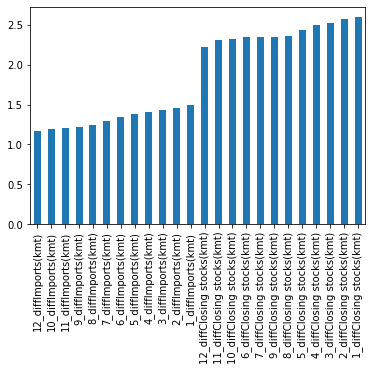

In [19]:
# Plotting missing data for train set
missing_percent_df =plot_missing_data(df_train)

In [20]:
#Train data
missing_percent_df

,0
12_diffImports(kmt),1.16813
10_diffImports(kmt),1.19438
11_diffImports(kmt),1.20751
9_diffImports(kmt),1.22063
8_diffImports(kmt),1.24688
7_diffImports(kmt),1.29938
6_diffImports(kmt),1.33876
5_diffImports(kmt),1.37813
4_diffImports(kmt),1.40438
3_diffImports(kmt),1.43063


In [21]:
# print value counts for all 'objects' with more than 1 null value
# This provide an output that shows the values of each categorical feature that has null values
def object_vcs_and_nulls(df):
  for i in df:
    if df[i].dtype == 'O':
      if df[i].isnull().sum() > 0:
        print(df[i].value_counts())  
        print("Number of Null Values: " + str(df[i].isnull().sum()))
        print("Percentage of Nulls = " + str(np.round((df[i].isnull().sum() / 14.60), 2)) + "%")
        print("\n")

In [22]:
#train data
object_vcs_and_nulls(df_train)

## Data Cleaning

### Imputing Missing Values

In [23]:
df_train['1_diffClosing stocks(kmt)'].fillna(value = df_train['1_diffClosing stocks(kmt)'].mean(), inplace = True)
df_train['2_diffClosing stocks(kmt)'].fillna(value = df_train['2_diffClosing stocks(kmt)'].mean(), inplace = True)
df_train['3_diffClosing stocks(kmt)'].fillna(value = df_train['3_diffClosing stocks(kmt)'].mean(), inplace = True)
df_train['4_diffClosing stocks(kmt)'].fillna(value = df_train['4_diffClosing stocks(kmt)'].mean(), inplace = True)
df_train['5_diffClosing stocks(kmt)'].fillna(value = df_train['5_diffClosing stocks(kmt)'].mean(), inplace = True)
df_train['6_diffClosing stocks(kmt)'].fillna(value = df_train['6_diffClosing stocks(kmt)'].mean(), inplace = True)
df_train['7_diffClosing stocks(kmt)'].fillna(value = df_train['7_diffClosing stocks(kmt)'].mean(), inplace = True)
df_train['8_diffClosing stocks(kmt)'].fillna(value = df_train['8_diffClosing stocks(kmt)'].mean(), inplace = True)
df_train['9_diffClosing stocks(kmt)'].fillna(value = df_train['9_diffClosing stocks(kmt)'].mean(), inplace = True)
df_train['10_diffClosing stocks(kmt)'].fillna(value = df_train['10_diffClosing stocks(kmt)'].mean(), inplace = True)
df_train['11_diffClosing stocks(kmt)'].fillna(value = df_train['11_diffClosing stocks(kmt)'].mean(), inplace = True)
df_train['12_diffClosing stocks(kmt)'].fillna(value = df_train['12_diffClosing stocks(kmt)'].mean(), inplace = True)

df_train['1_diffImports(kmt)'].fillna(value = df_train['1_diffImports(kmt)'].mean(), inplace = True)
df_train['2_diffImports(kmt)'].fillna(value = df_train['2_diffImports(kmt)'].mean(), inplace = True)
df_train['3_diffImports(kmt)'].fillna(value = df_train['3_diffImports(kmt)'].mean(), inplace = True)
df_train['4_diffImports(kmt)'].fillna(value = df_train['4_diffImports(kmt)'].mean(), inplace = True)
df_train['5_diffImports(kmt)'].fillna(value = df_train['5_diffImports(kmt)'].mean(), inplace = True)
df_train['6_diffImports(kmt)'].fillna(value = df_train['6_diffImports(kmt)'].mean(), inplace = True)
df_train['7_diffImports(kmt)'].fillna(value = df_train['7_diffImports(kmt)'].mean(), inplace = True)
df_train['8_diffImports(kmt)'].fillna(value = df_train['8_diffImports(kmt)'].mean(), inplace = True)
df_train['9_diffImports(kmt)'].fillna(value = df_train['9_diffImports(kmt)'].mean(), inplace = True)
df_train['10_diffImports(kmt)'].fillna(value = df_train['10_diffImports(kmt)'].mean(), inplace = True)
df_train['11_diffImports(kmt)'].fillna(value = df_train['11_diffImports(kmt)'].mean(), inplace = True)
df_train['12_diffImports(kmt)'].fillna(value = df_train['12_diffImports(kmt)'].mean(), inplace = True)


df_train.isnull().sum()

ID                                0
month                             0
country                           0
1_diffClosing stocks(kmt)         0
1_diffExports(kmt)                0
1_diffImports(kmt)                0
1_diffRefinery intake(kmt)        0
1_diffWTI                         0
1_diffSumClosing stocks(kmt)      0
1_diffSumExports(kmt)             0
1_diffSumImports(kmt)             0
1_diffSumProduction(kmt)          0
1_diffSumRefinery intake(kmt)     0
2_diffClosing stocks(kmt)         0
2_diffExports(kmt)                0
2_diffImports(kmt)                0
2_diffRefinery intake(kmt)        0
2_diffWTI                         0
2_diffSumClosing stocks(kmt)      0
2_diffSumExports(kmt)             0
2_diffSumImports(kmt)             0
2_diffSumProduction(kmt)          0
2_diffSumRefinery intake(kmt)     0
3_diffClosing stocks(kmt)         0
3_diffExports(kmt)                0
3_diffImports(kmt)                0
3_diffRefinery intake(kmt)        0
3_diffWTI                   

In [24]:
# analysing the "_diffImports(kmt)" columns for imputation

diffImports_kmt_cols = [col for col in df_train.columns if 'diffImports(kmt)' in col]

In [25]:
df_diffImports_kmt_cols = df_train.filter(diffImports_kmt_cols, axis=1)
df_diffImports_kmt_cols

,1_diffImports(kmt),2_diffImports(kmt),3_diffImports(kmt),4_diffImports(kmt),5_diffImports(kmt),6_diffImports(kmt),7_diffImports(kmt),8_diffImports(kmt),9_diffImports(kmt),10_diffImports(kmt),11_diffImports(kmt),12_diffImports(kmt)
0,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000
1,-125.00000,20.00000,-25.00000,-15.00000,-46.00000,19.00000,-23.00000,-25.00000,47.00000,-350.00000,-5.00000,2.00000
2,954.00000,-44.00000,50.00000,-22.00000,19.00000,-68.00000,82.00000,4.00000,-553.00000,536.00000,-17.00000,33.00000
3,499.00000,-77.00000,140.00000,320.00000,-94.00000,-552.00000,563.00000,-1528.00000,856.00000,-545.00000,652.00000,-680.00000
4,1.40450,-2.24720,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000
5,0.00000,9.76567,-4.41681,2.60466,0.80834,6.09599,1.03492,-1.13784,5.23250,-2.57294,3.15182,0.19902
6,1.80650,9.76567,-4.41681,2.60466,0.80834,6.09599,1.03492,-1.13784,5.23250,-2.57294,3.15182,0.19902
7,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000
8,0.00000,-71.32860,67.69230,-62.23780,69.93010,-66.71330,67.69230,-25.87410,28.53140,-76.92300,85.03490,-0.41950
9,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000


In [26]:
df_diffImports_kmt_cols.shape

(7619, 12)

In [27]:
df_diffImports_kmt_cols.describe()

,1_diffImports(kmt),2_diffImports(kmt),3_diffImports(kmt),4_diffImports(kmt),5_diffImports(kmt),6_diffImports(kmt),7_diffImports(kmt),8_diffImports(kmt),9_diffImports(kmt),10_diffImports(kmt),11_diffImports(kmt),12_diffImports(kmt)
count,7619.00000,7619.00000,7619.00000,7619.00000,7619.00000,7619.00000,7619.00000,7619.00000,7619.00000,7619.00000,7619.00000,7619.00000
mean,1.80650,9.76567,-4.41681,2.60466,0.80834,6.09599,1.03492,-1.13784,5.23250,-2.57294,3.15182,0.19902
std,703.46948,701.06574,682.49012,638.87467,647.81316,704.50760,706.42136,689.39930,701.27493,700.08209,689.45733,637.10609
min,-22159.00000,-22159.00000,-22159.00000,-22159.00000,-12490.00000,-22159.00000,-22159.00000,-22159.00000,-22159.00000,-22159.00000,-22159.00000,-22159.00000
25%,-46.00000,-45.00000,-48.04110,-46.00000,-46.79250,-46.00000,-50.00000,-46.28500,-47.62825,-49.00000,-50.00000,-50.00000
50%,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000
75%,47.00000,50.00000,47.00000,49.00000,48.00000,49.00000,48.00000,52.00000,50.00000,48.05240,50.00000,50.77575
max,22021.00000,22021.00000,22021.00000,12277.00000,22021.00000,22021.00000,22021.00000,22021.00000,22021.00000,22021.00000,22021.00000,12277.00000


In [28]:
#missing values
df_diffImports_kmt_cols["1_diffImports(kmt)"].isnull().sum()

0

In [29]:
# impute the missing values in "diffImports(kmt)" columns with mean

# Mean of values in columns
mean_values=df_train[['1_diffImports(kmt)', '2_diffImports(kmt)', '3_diffImports(kmt)',
       '4_diffImports(kmt)', '5_diffImports(kmt)', '6_diffImports(kmt)',
       '7_diffImports(kmt)', '8_diffImports(kmt)', '9_diffImports(kmt)',
       '10_diffImports(kmt)', '11_diffImports(kmt)', '12_diffImports(kmt)']].mean()
print(mean_values)

1_diffImports(kmt)     1.80650
2_diffImports(kmt)     9.76567
3_diffImports(kmt)    -4.41681
4_diffImports(kmt)     2.60466
5_diffImports(kmt)     0.80834
6_diffImports(kmt)     6.09599
7_diffImports(kmt)     1.03492
8_diffImports(kmt)    -1.13784
9_diffImports(kmt)     5.23250
10_diffImports(kmt)   -2.57294
11_diffImports(kmt)    3.15182
12_diffImports(kmt)    0.19902
dtype: float64


In [30]:
# Replace the NaNs in "_diffImports(kmt)" columns by their respective mean values

column_names = ['1_diffImports(kmt)', '2_diffImports(kmt)', '3_diffImports(kmt)',
       '4_diffImports(kmt)', '5_diffImports(kmt)', '6_diffImports(kmt)',
       '7_diffImports(kmt)', '8_diffImports(kmt)', '9_diffImports(kmt)',
       '10_diffImports(kmt)', '11_diffImports(kmt)', '12_diffImports(kmt)']

df_train[column_names] = df_train[column_names].fillna(value= mean_values)

In [31]:
df_train.isnull().sum()

ID                                0
month                             0
country                           0
1_diffClosing stocks(kmt)         0
1_diffExports(kmt)                0
1_diffImports(kmt)                0
1_diffRefinery intake(kmt)        0
1_diffWTI                         0
1_diffSumClosing stocks(kmt)      0
1_diffSumExports(kmt)             0
1_diffSumImports(kmt)             0
1_diffSumProduction(kmt)          0
1_diffSumRefinery intake(kmt)     0
2_diffClosing stocks(kmt)         0
2_diffExports(kmt)                0
2_diffImports(kmt)                0
2_diffRefinery intake(kmt)        0
2_diffWTI                         0
2_diffSumClosing stocks(kmt)      0
2_diffSumExports(kmt)             0
2_diffSumImports(kmt)             0
2_diffSumProduction(kmt)          0
2_diffSumRefinery intake(kmt)     0
3_diffClosing stocks(kmt)         0
3_diffExports(kmt)                0
3_diffImports(kmt)                0
3_diffRefinery intake(kmt)        0
3_diffWTI                   

In [32]:
df_diffImports_kmt_cols.columns

Index(['1_diffImports(kmt)', '2_diffImports(kmt)', '3_diffImports(kmt)',
       '4_diffImports(kmt)', '5_diffImports(kmt)', '6_diffImports(kmt)',
       '7_diffImports(kmt)', '8_diffImports(kmt)', '9_diffImports(kmt)',
       '10_diffImports(kmt)', '11_diffImports(kmt)', '12_diffImports(kmt)'],
      dtype='object')

In [33]:
#analysing the diffClosing stocks(kmt)

diffClosing_stocks_kmt_cols = [col for col in df_train.columns if 'diffClosing stocks(kmt)' in col]

In [34]:
df_diffClosing_stocks_kmt_cols = df_train.filter(diffClosing_stocks_kmt_cols, axis=1)

In [35]:
df_diffClosing_stocks_kmt_cols.shape

(7619, 12)

In [ ]:
df_diffClosing_stocks_kmt_cols.describe()

In [ ]:
#impute the missing values for columns "diffClosing_stocks_kmt_cols" with mean

closingstocks_mean_values = df_train[['1_diffClosing stocks(kmt)', '2_diffClosing stocks(kmt)',
       '3_diffClosing stocks(kmt)', '4_diffClosing stocks(kmt)',
       '5_diffClosing stocks(kmt)', '6_diffClosing stocks(kmt)',
       '7_diffClosing stocks(kmt)', '8_diffClosing stocks(kmt)',
       '9_diffClosing stocks(kmt)', '10_diffClosing stocks(kmt)',
       '11_diffClosing stocks(kmt)', '12_diffClosing stocks(kmt)']].mean()
print(closingstocks_mean_values)

1_diffClosing stocks(kmt)     0.79334
2_diffClosing stocks(kmt)    10.08205
3_diffClosing stocks(kmt)    -2.00880
4_diffClosing stocks(kmt)     0.30034
5_diffClosing stocks(kmt)    -4.45838
6_diffClosing stocks(kmt)    -1.56245
7_diffClosing stocks(kmt)    -7.35455
8_diffClosing stocks(kmt)     2.67338
9_diffClosing stocks(kmt)     2.38360
10_diffClosing stocks(kmt)    4.91835
11_diffClosing stocks(kmt)   -6.49642
12_diffClosing stocks(kmt)   -0.39809
dtype: float64


In [ ]:
# Replace the NaNs in "_diffClosing stocks(kmt)" columns by their respective mean values

column_names1 = ['1_diffClosing stocks(kmt)', '2_diffClosing stocks(kmt)',
       '3_diffClosing stocks(kmt)', '4_diffClosing stocks(kmt)',
       '5_diffClosing stocks(kmt)', '6_diffClosing stocks(kmt)',
       '7_diffClosing stocks(kmt)', '8_diffClosing stocks(kmt)',
       '9_diffClosing stocks(kmt)', '10_diffClosing stocks(kmt)',
       '11_diffClosing stocks(kmt)', '12_diffClosing stocks(kmt)']

df_train[column_names1] = df_train[column_names1].fillna(value= closingstocks_mean_values)


In [36]:
missing_values(df_train)

,Missing_Number,Missing_Percent


---
<a name = Section7></a>
# **7. Data Post-Profiling**

---

In [ ]:
#Use it
analysis = sv.analyze(df_train)
analysis.show_html('crude_oil_train.html')

                                             |          | [  0%]   00:00 -> (? left)

/usr/local/lib/python3.7/dist-packages/sweetviz/graph_associations.py:219: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  new_dataframe[feature] = pd.Series(dtype=float)


Report crude_oil_train.html was generated! NOTEBOOK/COLAB USERS: the web browser MAY not pop up, regardless, the report IS saved in your notebook/colab files.


In [ ]:
analysis.show_notebook()

---
<a name = Section8></a>
# **8. EDA**

---

1. Group by month and get the first entry for each month for the "_diffClosing stocks(kmt)" columns.


In [ ]:
# df_train.groupby("month")[column_names1].first()

2. Group by month, country. Get the first entry for each month for the "_diffClosing stocks(kmt)" columns.

In [ ]:
df_train.groupby(["month","country"])[column_names1].first()

1_diffClosing stocks(kmt)  2_diffClosing stocks(kmt)  \
month country                                                         
1     1                          0.00000                    0.00000   
      2                          0.00000                    0.00000   
      3                       -149.85960                   84.97190   
      4                        121.00000                 -197.00000   
      5                        -26.00000                   57.00000   
      6                         11.00000                  -17.00000   
      7                         -2.00000                   12.00000   
      8                        -15.00000                   54.00000   
      9                          0.00000                    0.00000   
      10                       565.45960                 -776.74090   
      11                      -110.00000                  -19.00000   
      12                        13.00000                  -40.00000   
      13                       231.00000                 -378.00000   
      14                         0.00000                    0.00000   
      15                         0.00000                    0.00000   
      16                        65.11300                  -49.29380   
      17                         4.24660                  -18.76710   
      18                       -63.00000                   -3.00000   
      19                       -79.00000                    0.00000   
      20                       -36.00000                  -69.00000   
      21                        12.02800                  -50.62940   
      22                      -242.14280                  218.57140   
      23                         0.00000                    0.00000   
      24                       -21.13890                  -13.22980   
      25                      -163.00000                  -53.00000   
      26                      -648.00000                   23.00000   
      27                       -76.00000                  -89.00000   
      28                         7.00000                  693.00000   
      29                         0.00000                    0.00000   
      30                       -37.00000                   38.00000   
      31                      -109.00000                 -484.00000   
      32                      1308.14110                    0.00000   
      33                         0.00000                    0.00000   
      34                         0.00000                    0.00000   
      35                        -7.00000                   15.00000   
      36                      -589.00000                  120.00000   
      37                        12.05480                  -21.64380   
      38                      -431.00000                  222.00000   
      39                         0.00000                    0.00000   
      40                       516.00000                 -194.00000   
      41                         0.00000                    0.00000   
      42                         0.00000                    0.00000   
      43                        61.00000                  -71.00000   
      44                         0.00000                    0.00000   
      45                      -148.00000                 -203.00000   
      46                         2.00000                   10.00000   
      47                       -44.00000                   97.00000   
      48                        -1.28750                  -16.45210   
      49                      -721.60000                  257.46670   
      50                       951.00000                 -272.00000   
      51                        28.00000                  -13.00000   
      52                         0.00000                    0.00000   
      53                         0.00000                    0.00000   
      54                         1.00000                  -51.00000   
      55                       -22.0000

Point 1 and 2 implies that the data for each month is not cumilative.

## Examining Target Variable Distribution

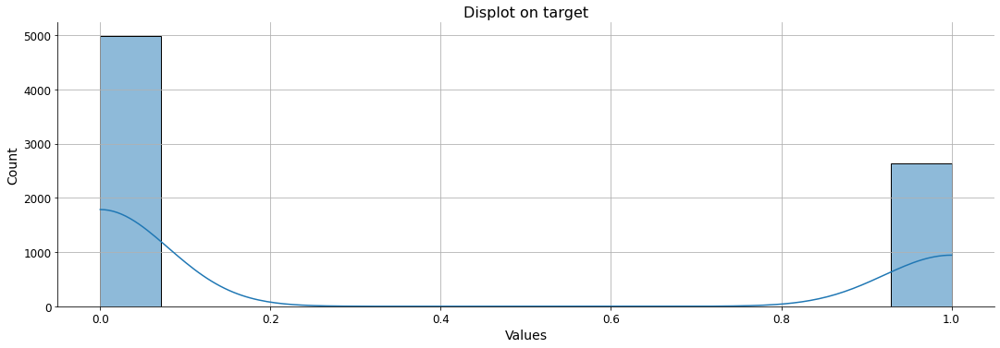

In [37]:
# Plot a displot on target variable
data_sns = df_train
sns.displot(x='Target', data=data_sns, kde=True, aspect=3)

# Add some cosmetics
plt.xticks(size=12)
plt.yticks(size=12)
plt.xlabel(xlabel='Values', size=14)
plt.ylabel(ylabel='Count', size=14)
plt.title(label='Displot on target', size=16)
plt.grid(b=True)

# Display the plot
plt.show()

##Feature Engineering

In [38]:
df_train = df_train.drop('ID',axis =1)


In [39]:
df_train.shape

(7619, 123)

---
<a name = Section9></a>
# **9. Splitting Data Into Training And Test**

---


In [ ]:
df_train.columns

Index(['month', 'country', '1_diffClosing stocks(kmt)', '1_diffExports(kmt)',
       '1_diffImports(kmt)', '1_diffRefinery intake(kmt)', '1_diffWTI',
       '1_diffSumClosing stocks(kmt)', '1_diffSumExports(kmt)',
       '1_diffSumImports(kmt)',
       ...
       '12_diffExports(kmt)', '12_diffImports(kmt)',
       '12_diffRefinery intake(kmt)', '12_diffWTI',
       '12_diffSumClosing stocks(kmt)', '12_diffSumExports(kmt)',
       '12_diffSumImports(kmt)', '12_diffSumProduction(kmt)',
       '12_diffSumRefinery intake(kmt)', 'Target'],
      dtype='object', length=123)

In [40]:
# Separate out the data into X features and y labels
# "Target" is the dependent variable

X = df_train.drop('Target',axis=1)
y = df_train['Target']

In [41]:
# Split up X and y into a training set and test set.

from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=42)

In [42]:
print('x_train shape: ', X_train.shape)
print('y_train shape: ', y_train.shape)
print('x_test shape: ', X_test.shape)
print('y_test shape: ', y_test.shape)

x_train shape:  (6095, 122)
y_train shape:  (6095,)
x_test shape:  (1524, 122)
y_test shape:  (1524,)


---
<a name = Section10></a>
# **10. Scaling / Standardizing**

---

In [49]:
# scale the X features

from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()

In [50]:
scaled_X_train = scaler.fit_transform(X_train)
scaled_X_test = scaler.transform(X_test)

---
<a name = Section11></a>
# **11. Model Building**

---

## Multiple Baseline Models

In [44]:
#import libraires
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score, cross_val_predict
from sklearn import svm
from sklearn.ensemble import RandomForestClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from xgboost import XGBClassifier
from sklearn.svm import SVC
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import GradientBoostingClassifier


In [53]:
from sklearn.metrics import accuracy_score
from sklearn.metrics import recall_score
from sklearn.metrics import precision_score
from sklearn.metrics import f1_score
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report
from sklearn.metrics import roc_auc_score

In [45]:
import time                                                         # For time functionality

In [46]:
from xgboost import XGBClassifier

In [51]:
#SVC(kernel = 'linear', C = 1,random_state = 0)
clfs = [LogisticRegression(solver='liblinear'),DecisionTreeClassifier(random_state = 0), RandomForestClassifier(n_estimators = 100, random_state = 0, n_jobs = -1)
       ,KNeighborsClassifier(n_neighbors = 6),GaussianNB(), GradientBoostingClassifier(random_state=0),XGBClassifier(n_estimators=64, random_state=0)]

In [54]:
for clf in clfs:

  # Extracting model name
  model_name = type(clf).__name__

  # Calculate start time
  start_time = time.time()

  # Train the model
  clf.fit(scaled_X_train, y_train)

  # Make predictions on the trained model
  predictions = clf.predict(scaled_X_test)


  ACCURACY_SCORE = accuracy_score(y_test,predictions)
  CLASSIFICATION_REPORT=classification_report(y_test,predictions)
  F1_SCORE=f1_score(y_test,predictions)

  # Calculate evaluated time
  elapsed_time = (time.time() - start_time)

  # Display the metrics and time took to develop the model
  print('Performance Metrics of', model_name, ':')
  print('[ACCURACY SCORE]:', ACCURACY_SCORE, '[Processing Time]:', elapsed_time, 'seconds')
  print('[CLASSIFICATION REPORT]:\n\n', CLASSIFICATION_REPORT)
  print('[F1_SCORE]:',F1_SCORE)

  print('----------------------------------------\n\n')


Performance Metrics of LogisticRegression :
[ACCURACY SCORE]: 0.7014435695538058 [Processing Time]: 0.4354889392852783 seconds
[CLASSIFICATION REPORT]:

               precision    recall  f1-score   support

           0       0.73      0.85      0.79       989
           1       0.60      0.43      0.50       535

    accuracy                           0.70      1524
   macro avg       0.67      0.64      0.65      1524
weighted avg       0.69      0.70      0.69      1524

[F1_SCORE]: 0.5038167938931297
----------------------------------------


Performance Metrics of DecisionTreeClassifier :
[ACCURACY SCORE]: 0.6496062992125984 [Processing Time]: 0.6722712516784668 seconds
[CLASSIFICATION REPORT]:

               precision    recall  f1-score   support

           0       0.73      0.73      0.73       989
           1       0.50      0.50      0.50       535

    accuracy                           0.65      1524
   macro avg       0.62      0.62      0.62      1524
weighted avg   

**Observations**:

**Multiple Baseline Model Performance** with default parameters:

| Model Name |Accuracy|F1-Score|
|--|--|--|
|**LogisticRegression :**|70.1|50.38|
|**Decision Tree :**|64.96|50.09|
|**Random Forest Classifier :**|**74.27**|**57.39**|
|**K Neighbour Classifier :**|67.91|27.75|
|**Gaussian N B :**|65.41|32.34|
|**Gradient Boosting Classifier :**|74.73|56.88|
|**XGBClassifier :**|74.54|56.00|


**Clearly Random Forest Classifier performs better than other Classifiers.**

## Base Model Random Forest Classifier

In [ ]:
rfc = RandomForestClassifier(n_estimators = 100 ,random_state=42)

# Train the model
rfc.fit(X_train, y_train)

RandomForestClassifier(random_state=42)

In [ ]:
# Make predictions on X_train
pred_train = rfc.predict(X_train)

In [ ]:
ACCURACY_SCORE = accuracy_score(y_train,pred_train)
CLASSIFICATION_REPORT=classification_report(y_train,pred_train)
F1_SCORE=f1_score(y_train,pred_train)

# Calculate evaluated time
elapsed_time = (time.time() - start_time)

# Display the metrics and time took to develop the model
print('Performance Metrics of Random Forest Classifer')
print('[ACCURACY SCORE]:', ACCURACY_SCORE, '[Processing Time]:', elapsed_time, 'seconds')
print('[CLASSIFICATION REPORT]:\n\n', CLASSIFICATION_REPORT)
print('[F1_SCORE]:',F1_SCORE)

print('----------------------------------------\n\n')

Performance Metrics of Random Forest Classifer
[ACCURACY SCORE]: 1.0 [Processing Time]: 14.54620623588562 seconds
[CLASSIFICATION REPORT]:

               precision    recall  f1-score   support

           0       1.00      1.00      1.00      3996
           1       1.00      1.00      1.00      2099

    accuracy                           1.00      6095
   macro avg       1.00      1.00      1.00      6095
weighted avg       1.00      1.00      1.00      6095

[F1_SCORE]: 1.0
----------------------------------------




In [ ]:
# Make predictions on the trained model
predictions = rfc.predict(X_test)

ACCURACY_SCORE = accuracy_score(y_test,predictions)
CLASSIFICATION_REPORT=classification_report(y_test,predictions)
F1_SCORE=f1_score(y_test,predictions)

# Calculate evaluated time
elapsed_time = (time.time() - start_time)

# Display the metrics and time took to develop the model
print('Performance Metrics of', model_name, ':')
print('[ACCURACY SCORE]:', ACCURACY_SCORE, '[Processing Time]:', elapsed_time, 'seconds')
print('[CLASSIFICATION REPORT]:\n\n', CLASSIFICATION_REPORT)
print('[F1_SCORE]:',F1_SCORE)

print('----------------------------------------\n\n')

Performance Metrics of XGBClassifier :
[ACCURACY SCORE]: 0.7473753280839895 [Processing Time]: 19.765681266784668 seconds
[CLASSIFICATION REPORT]:

               precision    recall  f1-score   support

           0       0.77      0.88      0.82       989
           1       0.69      0.51      0.59       535

    accuracy                           0.75      1524
   macro avg       0.73      0.69      0.70      1524
weighted avg       0.74      0.75      0.74      1524

[F1_SCORE]: 0.5864661654135339
----------------------------------------




#PCA

## Apply PCA with the original number of dimensions and see how well PCA captures the variance of the data.

In [ ]:
# We have not reduced the dimensionality at all (we’ve just transformed the data). 
# Therefore, the percentage of variance explained by original number of principal components should be 100%.

from sklearn.decomposition import PCA

X_train_pca = pca.fit_transform(X_train)
X_test_pca = pca.transform(X_test)

In [ ]:
# The explained_variance_ratio_ attribute of the PCA() class returns a one-dimensional numpy array,
#  which contains the values of the percentage of variance explained by each of the selected components.

explained_variance = pca.explained_variance_ratio_
explained_variance

array([0.16599717, 0.16207783, 0.08641885, 0.07515266, 0.07222139,
       0.07126855, 0.06810965, 0.03679735, 0.03115109, 0.02889708,
       0.02539997, 0.01656615, 0.0123329 , 0.01059664, 0.00931361,
       0.0088751 , 0.00775767, 0.00733077, 0.00717628, 0.00712197,
       0.0067139 , 0.00643747, 0.0052662 , 0.00521896, 0.00465934,
       0.00452744, 0.00408038, 0.00381201, 0.00361105, 0.00311784,
       0.00301155, 0.0027393 , 0.00256981, 0.00238101, 0.00216672,
       0.00207121, 0.00196279, 0.00192439, 0.00183241, 0.00173398,
       0.00168673, 0.00145515, 0.00133073, 0.0012915 , 0.00121003,
       0.00113808, 0.00109372, 0.00099496, 0.00093477, 0.00084297,
       0.00066943, 0.00065969, 0.00054173, 0.00049982, 0.00045663,
       0.00044798, 0.00041738, 0.00037153, 0.00026878, 0.0002562 ,
       0.00021879, 0.00021444])

In [ ]:
# If we get the cumulative sum of the above array, we can see the following array.

np.cumsum(pca.explained_variance_ratio_*100)

array([16.5997173 , 32.8075006 , 41.44938576, 48.9646518 , 56.18679101,
       63.31364582, 70.12461077, 73.80434574, 76.91945476, 79.80916275,
       82.34915997, 84.00577457, 85.23906422, 86.29872803, 87.23008931,
       88.11759918, 88.89336648, 89.62644302, 90.34407096, 91.05626813,
       91.72765799, 92.37140458, 92.89802422, 93.41991995, 93.88585377,
       94.33859764, 94.7466354 , 95.12783626, 95.48894096, 95.80072448,
       96.10187956, 96.37580949, 96.63279029, 96.8708917 , 97.08756413,
       97.29468522, 97.49096423, 97.68340319, 97.86664447, 98.04004207,
       98.20871517, 98.35422971, 98.48730249, 98.61645276, 98.73745614,
       98.85126462, 98.9606362 , 99.06013187, 99.15360873, 99.2379053 ,
       99.30484854, 99.37081739, 99.42498996, 99.47497217, 99.52063468,
       99.56543249, 99.60717049, 99.64432349, 99.67120148, 99.69682177,
       99.71870047, 99.74014464])

In [ ]:
print("The variance explained by original number of components is =",
      sum(pca.explained_variance_ratio_*100))

The variance explained by original number of components is = 99.74014464105004


In [ ]:
# plot the variance explained

# Initiate an empty figure
fig = go.Figure()

var = np.cumsum(np.round(a=pca.explained_variance_ratio_, decimals=3) * 100)

# Add a trace of bar to the figure
fig.add_trace(trace=go.Scatter(x=list(range(1000)),
                               y= var,
                               name="'Cumulative Explained Variance'",
                               mode='lines+markers'))

# Update the layout with some cosmetics
fig.update_layout(height=500, 
                  width=1000, 
                  title_text='PCA Analysis', 
                  title_x=0.5,
                  xaxis_title='Number of components', 
                  yaxis_title='Explained Variance %')



**Observation**

- You can see that the first 61 principal components keep about 99.4% of the variability in the dataset while reducing 62 (123-61) features in the dataset. That’s great. The remaining 60 features only contain less than 1% of the variability in data.
- This means that the algorithm has found 61 principal components to preserve 99.4% of the variability in the data. The pca array holds the values of all 61 principal components. 
- When we compare with the original dataset that has 123 features, this contains only 61 features, but with 99.4% of the variability in data.

## Apply PCA wit 61 components.

In [ ]:
pca = PCA(n_components=61)
X_train_pca = pca.fit_transform(X_train)
X_test_pca = pca.transform(X_test)

In [ ]:
for clf in clfs:

  # Extracting model name
  model_name = type(clf).__name__

  # Calculate start time
  start_time = time.time()

  # Train the model
  clf.fit(X_train_pca, y_train)

  # Make predictions on the trained model
  predictions = clf.predict(X_test_pca)


  ACCURACY_SCORE = accuracy_score(y_test,predictions)
  CLASSIFICATION_REPORT=classification_report(y_test,predictions)
  F1_SCORE=f1_score(y_test,predictions)

  # Calculate evaluated time
  elapsed_time = (time.time() - start_time)

  # Display the metrics and time took to develop the model
  print('Performance Metrics of', model_name, ':')
  print('[ACCURACY SCORE]:', ACCURACY_SCORE, '[Processing Time]:', elapsed_time, 'seconds')
  print('[CLASSIFICATION REPORT]:\n\n', CLASSIFICATION_REPORT)
  print('[F1_SCORE]:',F1_SCORE)

  print('----------------------------------------\n')

Performance Metrics of RandomForestClassifier :
[ACCURACY SCORE]: 0.7060367454068242 [Processing Time]: 4.376996040344238 seconds
[CLASSIFICATION REPORT]:

               precision    recall  f1-score   support

           0       0.73      0.86      0.79       989
           1       0.62      0.42      0.50       535

    accuracy                           0.71      1524
   macro avg       0.68      0.64      0.65      1524
weighted avg       0.69      0.71      0.69      1524

[F1_SCORE]: 0.5033259423503327
----------------------------------------



**Observation**

**Model Performance Comparision**:

| Model Name |Accuracy|F1-Score|
|--|--|--|
|**Random Forest Classifier :**|**74.27**|**57.39**|
|**Random Forest Classifier with PCA:**|**70.60**|**50.33**|
| |  |  |


- Clearly the Random Forest Flassifier has better Accuracy and F1-Score without implementing PCA.

- Therefore, going further, we will consider hyper parameter tuning the  Random Forest Classifier based on the original variables instead of few principal components (PCA) extracted from those.

# Hyper Parameter Tuning - 1

Classifier: Random Forest Classifier

Approach: Hyperparameters optimized by the grid search CV 

Hyperparameters: 
  - n_estimators = number of trees in the foreset
  - max_features = max number of features considered for splitting a node
  - max_depth = max number of levels in each decision tree
  - Criterion = Entropy, Gini Index

  For the rest of the parameters, we will use the default value as defined by scikit-learn.

In [ ]:
from sklearn.model_selection import KFold                           # To create k folds for cross validation
from sklearn.model_selection import cross_validate                  # To calculate cross validation scores
from sklearn.model_selection import GridSearchCV                    # To tune the models

##Random Forest Classifier - Model 1

In [ ]:
# Creating a parameter grid for Random Forest only
param_grid_rfc = { 'n_estimators': [64,128,256],
                  'max_depth' : [5, 7 , 8, 10]}

# Putting the parameters in a list
param_grid = [param_grid_rfc]

i = 0

# Creating lists to store scores, models and parameters
best_scores = []
best_models = []
best_params = []

# Instantiating model
clfs = [RandomForestClassifier(random_state=42, class_weight='balanced')]

for clf in clfs:
  # Extracting model name
  model_name = type(clf).__name__

  # Applying GridSearchCV on the model
  cv = GridSearchCV(estimator=clf, param_grid=param_grid[i], cv= 5, scoring = "f1")

  # Calculating start time
  start_time = time.time()

  # Fitting the model in train set
  cv.fit(scaled_X_train, y_train)

  # Calculating evaluated time
  evaluated_time = time.time()-start_time

  # Append best score, parameters and models in lists
  best_scores.append(cv.best_score_)
  best_params.append(cv.best_params_)
  best_models.append(cv.best_estimator_)

  best_grid = cv.best_estimator_
  grid_accuracy = cross_validate(best_grid, scaled_X_train, y_train)
  
  # Print time taken for tuning
  print('Time taken for tuning', model_name ,' is: ', np.round(evaluated_time, 2), 'sec')
  print('----------------------------------------\n')
  i += 1
  
print(cv.best_score_)
print(cv.best_params_)
print(cv.best_estimator_)
print(grid_accuracy)

Time taken for tuning RandomForestClassifier  is:  167.02 sec
----------------------------------------

0.6141311984790245
{'max_depth': 7, 'n_estimators': 256}
RandomForestClassifier(class_weight='balanced', max_depth=7, n_estimators=256,
                       random_state=42)
{'fit_time': array([4.29757118, 4.34113026, 4.2713306 , 4.34414077, 4.27612233]), 'score_time': array([0.07254648, 0.07457662, 0.07435894, 0.08122373, 0.07361293]), 'test_score': array([0.77358491, 0.74651354, 0.75389664, 0.74651354, 0.74815422])}


##Random Forest Classifier - Model 2

In [ ]:
# Creating a parameter grid (the search space) for Random Forest 
param_grid_rfc = { 'n_estimators': [140, 145, 150, 155, 160],
                  'max_features': ['auto', 'sqrt', 'log2'],
                  'max_depth' : [10,12,13,15,17,19,21],
                  'criterion' :['gini', 'entropy']}

# Putting the parameters in a list
param_grid = [param_grid_rfc]

i = 0

# Creating lists to store scores, models and parameters
best_scores = []
best_models = []
best_params = []

# Use the random grid to search for best hyperparameters
# First create the base model to tune

clfs = [RandomForestClassifier(random_state=42, class_weight='balanced')]

for clf in clfs:
  # Extracting model name
  model_name = type(clf).__name__

  # Applying GridSearchCV on the model
  # GridSearch of parameters, using 5 fold cross validation, 
  cv = GridSearchCV(estimator=clf, param_grid=param_grid[i], cv= 5, scoring = "f1")

  # Calculating start time
  start_time = time.time()

  # Fit the gridsearch cv model to the train set
  cv.fit(scaled_X_train, y_train)

  # Calculating evaluated time
  evaluated_time = time.time()-start_time

  # Append best score, parameters and models in lists
  best_scores.append(cv.best_score_)
  best_params.append(cv.best_params_)
  best_models.append(cv.best_estimator_)

  # Print time taken for tuning
  print('Time taken for tuning', model_name ,' is: ', np.round(evaluated_time, 2), 'sec')
  print('----------------------------------------\n')
  i += 1
  
print(cv.best_score_)
print(cv.best_params_)
print(cv.best_estimator_)

Time taken for tuning RandomForestClassifier  is:  4634.4 sec
----------------------------------------

0.6082240329718186
{'criterion': 'entropy', 'max_depth': 10, 'max_features': 'log2', 'n_estimators': 145}
RandomForestClassifier(class_weight='balanced', criterion='entropy',
                       max_depth=10, max_features='log2', n_estimators=145,
                       random_state=42)


## Random Forest Classifier -Model 3 





In [55]:
# Creating a parameter grid for Random Forest only
param_grid_rfc3 = { 'n_estimators': [64,128,256],
                  'max_depth' : [5, 7 , 8, 10],
                  'max_features': ['auto', 'sqrt', 'log2'],
                  'criterion' :['gini', 'entropy']}

# Putting the parameters in a list
param_grid3 = [param_grid_rfc3]

i = 0

# Creating lists to store scores, models and parameters
best_scores = []
best_models = []
best_params = []

# Instantiating model
clfs = [RandomForestClassifier(random_state=42, class_weight='balanced')]

for clf in clfs:
  # Extracting model name
  model_name = type(clf).__name__

  # Applying GridSearchCV on the model
  cv3 = GridSearchCV(estimator=clf, param_grid=param_grid3[i], cv= 5, scoring="f1")

  # Calculating start time
  start_time = time.time()

  # Fitting the model in train set
  cv3.fit(scaled_X_train, y_train)

  # Calculating evaluated time
  evaluated_time = time.time()-start_time

  # Append best score, parameters and models in lists
  best_scores.append(cv3.best_score_)
  best_params.append(cv3.best_params_)
  best_models.append(cv3.best_estimator_)

  # Print time taken for tuning
  print('Time taken for tuning', model_name ,' is: ', np.round(evaluated_time, 2), 'sec')
  print('----------------------------------------\n')
  i += 1
  
print(cv3.best_score_)
print(cv3.best_params_)
print(cv3.best_estimator_)

Time taken for tuning RandomForestClassifier  is:  991.89 sec
----------------------------------------

0.615981715429269
{'criterion': 'entropy', 'max_depth': 7, 'max_features': 'auto', 'n_estimators': 256}
RandomForestClassifier(class_weight='balanced', criterion='entropy',
                       max_depth=7, n_estimators=256, random_state=42)


## Random Forest Classifier -Model 4 




In [ ]:
# Creating a parameter grid for Random Forest only
param_grid_rfc = { 'n_estimators': [64,128,256],
                  'max_depth' : [5, 7 , 8, 10],
                  'max_features': ['auto', 'sqrt', 'log2']}

# Putting the parameters in a list
param_grid = [param_grid_rfc]

i = 0

# Creating lists to store scores, models and parameters
best_scores = []
best_models = []
best_params = []

# Instantiating model
clfs = [RandomForestClassifier(random_state=42, class_weight='balanced')]

for clf in clfs:
  # Extracting model name
  model_name = type(clf).__name__

  # Applying GridSearchCV on the model
  cv = GridSearchCV(estimator=clf, param_grid=param_grid[i], cv= 3, scoring="f1")

  # Calculating start time
  start_time = time.time()

  # Fitting the model in train set
  cv.fit(scaled_X_train, y_train)

  # Calculating evaluated time
  evaluated_time = time.time()-start_time

  # Append best score, parameters and models in lists
  best_scores.append(cv.best_score_)
  best_params.append(cv.best_params_)
  best_models.append(cv.best_estimator_)

  # Print time taken for tuning
  print('Time taken for tuning', model_name ,' is: ', np.round(evaluated_time, 2), 'sec')
  print('----------------------------------------\n')
  i += 1
  
print(cv.best_score_)
print(cv.best_params_)
print(cv.best_estimator_)

Time taken for tuning RandomForestClassifier  is:  225.94 sec
----------------------------------------

0.6132698421638733
{'max_depth': 8, 'max_features': 'log2', 'n_estimators': 128}
RandomForestClassifier(class_weight='balanced', max_depth=8,
                       max_features='log2', n_estimators=128, random_state=42)


##Model 5

In [ ]:
# Creating a parameter grid for Random Forest only
param_grid_rfc = { 'n_estimators': [150],
                  'max_depth' : [15],
                  'max_features': ['auto'],
                  'criterion' : ['entropy']}

# Putting the parameters in a list
param_grid = [param_grid_rfc]

i = 0

# Creating lists to store scores, models and parameters
best_scores = []
best_models = []
best_params = []

# Instantiating model
clfs = [RandomForestClassifier(random_state=42, class_weight='balanced')]

for clf in clfs:
  # Extracting model name
  model_name = type(clf).__name__

  # Applying GridSearchCV on the model
  cv = GridSearchCV(estimator=clf, param_grid=param_grid[i], cv= 5)

  # Calculating start time
  start_time = time.time()

  # Fitting the model in train set
  cv.fit(scaled_X_train, y_train)

  # Calculating evaluated time
  evaluated_time = time.time()-start_time

  # Append best score, parameters and models in lists
  best_scores.append(cv.best_score_)
  best_params.append(cv.best_params_)
  best_models.append(cv.best_estimator_) 


  # Print time taken for tuning
  print('Time taken for tuning', model_name ,' is: ', np.round(evaluated_time, 2), 'sec')
  print('----------------------------------------\n')
  i += 1
  
print(cv.best_score_)
print(cv.best_params_)
print(cv.best_estimator_)


Time taken for tuning RandomForestClassifier  is:  42.03 sec
----------------------------------------

0.7583264971287942
{'criterion': 'entropy', 'max_depth': 15, 'max_features': 'auto', 'n_estimators': 150}
RandomForestClassifier(class_weight='balanced', criterion='entropy',
                       max_depth=15, n_estimators=150, random_state=42)


In [ ]:
# Creating a parameter grid for Random Forest only
param_grid_rfc = { 'n_estimators': [150],
                  'max_depth' : [15],
                  'max_features': ['auto'],
                  'criterion' : ['entropy']}

# Putting the parameters in a list
param_grid = [param_grid_rfc]

i = 0

# Creating lists to store scores, models and parameters
best_scores = []
best_models = []
best_params = []

# Instantiating model
clfs = [RandomForestClassifier(random_state=42, class_weight='balanced')]

for clf in clfs:
  # Extracting model name
  model_name = type(clf).__name__

  # Applying GridSearchCV on the model
  cv = GridSearchCV(estimator=clf, param_grid=param_grid[i], cv= 5, scoring="f1")

  # Calculating start time
  start_time = time.time()

  # Fitting the model in train set
  cv.fit(scaled_X_train, y_train)

  # Calculating evaluated time
  evaluated_time = time.time()-start_time

  # Append best score, parameters and models in lists
  best_scores.append(cv.best_score_)
  best_params.append(cv.best_params_)
  best_models.append(cv.best_estimator_)

  # Print time taken for tuning
  print('Time taken for tuning', model_name ,' is: ', np.round(evaluated_time, 2), 'sec')
  print('----------------------------------------\n')
  i += 1
  
print(cv.best_score_)
print(cv.best_params_)
print(cv.best_estimator_)

Time taken for tuning RandomForestClassifier  is:  42.44 sec
----------------------------------------

0.5864306518386291
{'criterion': 'entropy', 'max_depth': 15, 'max_features': 'auto', 'n_estimators': 150}
RandomForestClassifier(class_weight='balanced', criterion='entropy',
                       max_depth=15, n_estimators=150, random_state=42)


In [ ]:
# Creating a parameter grid for Random Forest only
param_grid_rfc = { 'n_estimators': [300],
                  'max_depth' : [4,5,6,7,8,9,10,11,12,13,14,15]}

# Putting the parameters in a list
param_grid = [param_grid_rfc]

i = 0

# Creating lists to store scores, models and parameters
best_scores = []
best_models = []
best_params = []

# Instantiating model
clfs = [RandomForestClassifier(random_state=42, class_weight='balanced')]

for clf in clfs:
  # Extracting model name
  model_name = type(clf).__name__

  # Applying GridSearchCV on the model
  cv = GridSearchCV(estimator=clf, param_grid=param_grid[i], cv= 5,scoring="f1")

  # Calculating start time
  start_time = time.time()

  # Fitting the model in train set
  cv.fit(scaled_X_train, y_train)

  # Calculating evaluated time
  evaluated_time = time.time()-start_time

  # Append best score, parameters and models in lists
  best_scores.append(cv.best_score_)
  best_params.append(cv.best_params_)
  best_models.append(cv.best_estimator_) 


  # Print time taken for tuning
  print('Time taken for tuning', model_name ,' is: ', np.round(evaluated_time, 2), 'sec')
  print('----------------------------------------\n')
  i += 1
  
print(cv.best_score_)
print(cv.best_params_)
print(cv.best_estimator_)

Time taken for tuning RandomForestClassifier  is:  381.41 sec
----------------------------------------

0.616618510503622
{'max_depth': 7, 'n_estimators': 300}
RandomForestClassifier(class_weight='balanced', max_depth=7, n_estimators=300,
                       random_state=42)


**Observation**:

Performance comparision of Random Classification Models using the Grid Search CV Technique. Where the hyperparameters are tuned with different parameter grids and parameter range 

We can make some quick comparisons between the different approaches used to improve performance showing the returns on each.


| RFC Tuned Model | Time Taken |F1-Score|n_estimators|max_depth|max_features |Criterion|
|--|----|--|--|--|--|--|
|**Model 1**|166.38 sec  |61.41|256|10|default|default|
|**Model 2**|2535.01 sec |60.82|150|15|auto|entropy|
|**Model 3**|1037.6 sec  |61.6|128|8|auto|entropy|
|**Model 4**|223.6 sec   |61.33|128|8|auto|default|


# Model Selection

The list in the observation in the cell above is an overview of the different model configurations, ranked by their F1-Scores. 

**Model 3 achieved the highest F1-Score**. The parameters of this model are a **maximum depth of 7** and several **estimators of 256** with computation time of 1037 seconds.

**We select the Model 3 as the best model and use it to predict the test/unseen data.**

# Model Evaluation

**The Best Parameters selected are**:

| Tuned Model 1 | Time Taken | F1-Score |n_estimators|max_depth|max_features |Criterion|
|--|----|--|--|--|--|--|
|**Model 3**|1037 sec  |61.6|256|8|auto|entropy|


In [ ]:
cv.best_estimator_

RandomForestClassifier(class_weight='balanced', criterion='entropy',
                       max_depth=15, n_estimators=150, random_state=42)

In [ ]:
# Evaluate random forest model with best parameters

best_rfc = cv.best_estimator_
best_rfc




RandomForestClassifier(class_weight='balanced', criterion='entropy',
                       max_depth=15, n_estimators=150, random_state=42)

In [ ]:
# Fit the bestmodel to the train data

best_rfc.fit(X_train,y_train)

RandomForestClassifier(class_weight='balanced', criterion='entropy',
                       max_depth=15, n_estimators=150, random_state=42)

In [ ]:
# Make predictions on the trained model

y_pred_train = best_rfc.predict(X_train)
y_pred_train

array([1, 0, 0, ..., 1, 0, 0])

In [ ]:
# Make predictions on the test data

y_pred_test = best_rfc.predict (X_test)
y_pred_test

array([0, 0, 0, ..., 0, 0, 1])

In [ ]:
# Calculating the Train metrics

ACCURACY_SCORE_TRAIN = accuracy_score(y_train,y_pred_train)
CLASSIFICATION_REPORT_TRAIN =classification_report(y_train,y_pred_train)
F1_SCORE_TRAIN =f1_score(y_train,y_pred_train)

In [ ]:
# Calculating the Test Metrics

ACCURACY_SCORE_TEST = accuracy_score(y_test,y_pred_test)
CLASSIFICATION_REPORT_TEST =classification_report(y_test,y_pred_test)
F1_SCORE_TEST=f1_score(y_test,y_pred_test)

In [ ]:
# Display the metrics and time took to train the model (Train)

print('Performance Metrics of Train set : Random Forest Classifier')
print('[ACCURACY SCORE]:', ACCURACY_SCORE_TRAIN)
print('[CLASSIFICATION REPORT]:', CLASSIFICATION_REPORT_TRAIN)
print('[F1_SCORE]:',F1_SCORE_TRAIN)
print('----------------------------------------\n')

Performance Metrics of Train set : Random Forest Classifier
[ACCURACY SCORE]: 0.9847415914684168
[CLASSIFICATION REPORT]:               precision    recall  f1-score   support

           0       0.98      1.00      0.99      3996
           1       1.00      0.96      0.98      2099

    accuracy                           0.98      6095
   macro avg       0.99      0.98      0.98      6095
weighted avg       0.99      0.98      0.98      6095

[F1_SCORE]: 0.9773557341124909
----------------------------------------



In [ ]:
# Display the metrics and time took to test the model (Test)

print('Performance Metrics of Test Set: Random Forest Classifier')
print('[ACCURACY_SCORE]:', ACCURACY_SCORE_TEST)
print('[CLASSIFICATION REPORT]:', CLASSIFICATION_REPORT_TEST)

print('[F1_SCORE]:',F1_SCORE_TEST)
print('----------------------------------------\n')

Performance Metrics of Test Set: Random Forest Classifier
[ACCURACY_SCORE]: 0.7467191601049868
[CLASSIFICATION REPORT]:               precision    recall  f1-score   support

           0       0.76      0.88      0.82       989
           1       0.70      0.49      0.58       535

    accuracy                           0.75      1524
   macro avg       0.73      0.69      0.70      1524
weighted avg       0.74      0.75      0.73      1524

[F1_SCORE]: 0.5767543859649122
----------------------------------------



**Base Model Performance** :

|  |Accuracy|F1-Score|
|--|--|--|
|**Train Data**|1.00|1.00|
|**Test Data**|74.73|58.64|

**Best Model Performance** :

|  |Accuracy|F1-Score|
|--|--|--|
|**Train Data**|98.47|97.73|
|**Test Data**|74.67|57.67|

---
<a name = Section12></a>
# **12. Predicting Unseen Data**

---

In [56]:
# Fetching the Unseen data
df_unseen = pd.read_csv("/content/drive/MyDrive/Oil_test.csv")

In [57]:
df_unseen.head(5)

,ID,month,country,1_diffClosing stocks(kmt),1_diffExports(kmt),1_diffImports(kmt),1_diffRefinery intake(kmt),1_diffWTI,1_diffSumClosing stocks(kmt),1_diffSumExports(kmt),1_diffSumImports(kmt),1_diffSumProduction(kmt),1_diffSumRefinery intake(kmt),2_diffClosing stocks(kmt),2_diffExports(kmt),2_diffImports(kmt),2_diffRefinery intake(kmt),2_diffWTI,2_diffSumClosing stocks(kmt),2_diffSumExports(kmt),2_diffSumImports(kmt),2_diffSumProduction(kmt),2_diffSumRefinery intake(kmt),3_diffClosing stocks(kmt),3_diffExports(kmt),3_diffImports(kmt),3_diffRefinery intake(kmt),3_diffWTI,3_diffSumClosing stocks(kmt),3_diffSumExports(kmt),3_diffSumImports(kmt),3_diffSumProduction(kmt),3_diffSumRefinery intake(kmt),4_diffClosing stocks(kmt),4_diffExports(kmt),4_diffImports(kmt),4_diffRefinery intake(kmt),4_diffWTI,4_diffSumClosing stocks(kmt),4_diffSumExports(kmt),4_diffSumImports(kmt),4_diffSumProduction(kmt),4_diffSumRefinery intake(kmt),5_diffClosing stocks(kmt),5_diffExports(kmt),5_diffImports(kmt),5_diffRefinery intake(kmt),5_diffWTI,5_diffSumClosing stocks(kmt),5_diffSumExports(kmt),5_diffSumImports(kmt),5_diffSumProduction(kmt),5_diffSumRefinery intake(kmt),6_diffClosing stocks(kmt),6_diffExports(kmt),6_diffImports(kmt),6_diffRefinery intake(kmt),6_diffWTI,6_diffSumClosing stocks(kmt),6_diffSumExports(kmt),6_diffSumImports(kmt),6_diffSumProduction(kmt),6_diffSumRefinery intake(kmt),7_diffClosing stocks(kmt),7_diffExports(kmt),7_diffImports(kmt),7_diffRefinery intake(kmt),7_diffWTI,7_diffSumClosing stocks(kmt),7_diffSumExports(kmt),7_diffSumImports(kmt),7_diffSumProduction(kmt),7_diffSumRefinery intake(kmt),8_diffClosing stocks(kmt),8_diffExports(kmt),8_diffImports(kmt),8_diffRefinery intake(kmt),8_diffWTI,8_diffSumClosing stocks(kmt),8_diffSumExports(kmt),8_diffSumImports(kmt),8_diffSumProduction(kmt),8_diffSumRefinery intake(kmt),9_diffClosing stocks(kmt),9_diffExports(kmt),9_diffImports(kmt),9_diffRefinery intake(kmt),9_diffWTI,9_diffSumClosing stocks(kmt),9_diffSumExports(kmt),9_diffSumImports(kmt),9_diffSumProduction(kmt),9_diffSumRefinery intake(kmt),10_diffClosing stocks(kmt),10_diffExports(kmt),10_diffImports(kmt),10_diffRefinery intake(kmt),10_diffWTI,10_diffSumClosing stocks(kmt),10_diffSumExports(kmt),10_diffSumImports(kmt),10_diffSumProduction(kmt),10_diffSumRefinery intake(kmt),11_diffClosing stocks(kmt),11_diffExports(kmt),11_diffImports(kmt),11_diffRefinery intake(kmt),11_diffWTI,11_diffSumClosing stocks(kmt),11_diffSumExports(kmt),11_diffSumImports(kmt),11_diffSumProduction(kmt),11_diffSumRefinery intake(kmt),12_diffClosing stocks(kmt),12_diffExports(kmt),12_diffImports(kmt),12_diffRefinery intake(kmt),12_diffWTI,12_diffSumClosing stocks(kmt),12_diffSumExports(kmt),12_diffSumImports(kmt),12_diffSumProduction(kmt),12_diffSumRefinery intake(kmt)
0,ID03667,7,70,115.00000,0.00000,64.00000,101.00000,3.47000,-1389.79110,8409.34830,327.28040,7339.68150,5869.72890,-178.00000,0.00000,-52.00000,218.00000,0.59000,2029.26970,-16196.64950,-1478.00840,-15979.72140,-10585.72020,-29.00000,0.00000,308.00000,137.00000,0.41000,3248.91990,9926.70860,4603.59730,11148.10710,11514.67140,-30.00000,0.00000,133.00000,177.00000,1.20000,-2667.61060,2274.47330,-4053.96700,-219.45840,2538.48100,-60.00000,0.00000,-92.00000,-196.00000,-2.57000,355.82370,-8931.13230,3955.89830,-9144.69750,-9465.90630,210.00000,0.00000,-134.00000,-227.00000,0.05000,4889.53310,6657.91950,1690.70620,11520.71380,9405.54410,-118.00000,0.00000,-76.00000,135.00000,1.09000,-3976.87150,-6369.54200,-6065.52230,-10153.00550,-5197.61300,-375.00000,0.00000,-351.00000,41.00000,2.18000,1148.75740,9992.28640,11136.53890,12455.01820,9752.46200,160.00000,0.00000,366.00000,-337.00000,0.65000,11955.62390,2183.35480,2914.95670,-258.38850,4412.76390,241.00000,0.00000,-47.00000,26.00000,2.92000,673.85690,-13007.15200,-5932.54820,-17130.83330,-13151.45600,-134.00000,0.00000,-32.00000,295.00000,-0.33000,6320.47280,19899.82420,10094.17440,16736.83010,10951.46880,277.00000,0.00000,-74.00000,-461.0000

In [58]:
df_unseen.shape

(2540, 123)

In [59]:
df_unseen.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2540 entries, 0 to 2539
Columns: 123 entries, ID to 12_diffSumRefinery intake(kmt)
dtypes: float64(120), int64(2), object(1)
memory usage: 2.4+ MB


In [60]:
df_unseen.describe()

,month,country,1_diffClosing stocks(kmt),1_diffExports(kmt),1_diffImports(kmt),1_diffRefinery intake(kmt),1_diffWTI,1_diffSumClosing stocks(kmt),1_diffSumExports(kmt),1_diffSumImports(kmt),1_diffSumProduction(kmt),1_diffSumRefinery intake(kmt),2_diffClosing stocks(kmt),2_diffExports(kmt),2_diffImports(kmt),2_diffRefinery intake(kmt),2_diffWTI,2_diffSumClosing stocks(kmt),2_diffSumExports(kmt),2_diffSumImports(kmt),2_diffSumProduction(kmt),2_diffSumRefinery intake(kmt),3_diffClosing stocks(kmt),3_diffExports(kmt),3_diffImports(kmt),3_diffRefinery intake(kmt),3_diffWTI,3_diffSumClosing stocks(kmt),3_diffSumExports(kmt),3_diffSumImports(kmt),3_diffSumProduction(kmt),3_diffSumRefinery intake(kmt),4_diffClosing stocks(kmt),4_diffExports(kmt),4_diffImports(kmt),4_diffRefinery intake(kmt),4_diffWTI,4_diffSumClosing stocks(kmt),4_diffSumExports(kmt),4_diffSumImports(kmt),4_diffSumProduction(kmt),4_diffSumRefinery intake(kmt),5_diffClosing stocks(kmt),5_diffExports(kmt),5_diffImports(kmt),5_diffRefinery intake(kmt),5_diffWTI,5_diffSumClosing stocks(kmt),5_diffSumExports(kmt),5_diffSumImports(kmt),5_diffSumProduction(kmt),5_diffSumRefinery intake(kmt),6_diffClosing stocks(kmt),6_diffExports(kmt),6_diffImports(kmt),6_diffRefinery intake(kmt),6_diffWTI,6_diffSumClosing stocks(kmt),6_diffSumExports(kmt),6_diffSumImports(kmt),6_diffSumProduction(kmt),6_diffSumRefinery intake(kmt),7_diffClosing stocks(kmt),7_diffExports(kmt),7_diffImports(kmt),7_diffRefinery intake(kmt),7_diffWTI,7_diffSumClosing stocks(kmt),7_diffSumExports(kmt),7_diffSumImports(kmt),7_diffSumProduction(kmt),7_diffSumRefinery intake(kmt),8_diffClosing stocks(kmt),8_diffExports(kmt),8_diffImports(kmt),8_diffRefinery intake(kmt),8_diffWTI,8_diffSumClosing stocks(kmt),8_diffSumExports(kmt),8_diffSumImports(kmt),8_diffSumProduction(kmt),8_diffSumRefinery intake(kmt),9_diffClosing stocks(kmt),9_diffExports(kmt),9_diffImports(kmt),9_diffRefinery intake(kmt),9_diffWTI,9_diffSumClosing stocks(kmt),9_diffSumExports(kmt),9_diffSumImports(kmt),9_diffSumProduction(kmt),9_diffSumRefinery intake(kmt),10_diffClosing stocks(kmt),10_diffExports(kmt),10_diffImports(kmt),10_diffRefinery intake(kmt),10_diffWTI,10_diffSumClosing stocks(kmt),10_diffSumExports(kmt),10_diffSumImports(kmt),10_diffSumProduction(kmt),10_diffSumRefinery intake(kmt),11_diffClosing stocks(kmt),11_diffExports(kmt),11_diffImports(kmt),11_diffRefinery intake(kmt),11_diffWTI,11_diffSumClosing stocks(kmt),11_diffSumExports(kmt),11_diffSumImports(kmt),11_diffSumProduction(kmt),11_diffSumRefinery intake(kmt),12_diffClosing stocks(kmt),12_diffExports(kmt),12_diffImports(kmt),12_diffRefinery intake(kmt),12_diffWTI,12_diffSumClosing stocks(kmt),12_diffSumExports(kmt),12_diffSumImports(kmt),12_diffSumProduction(kmt),12_diffSumRefinery intake(kmt)
count,2540.00000,2540.00000,2477.00000,2540.00000,2503.00000,2540.00000,2540.00000,2540.00000,2540.00000,2540.00000,2540.00000,2540.00000,2479.00000,2540.00000,2503.00000,2540.00000,2540.00000,2540.00000,2540.00000,2540.00000,2540.00000,2540.00000,2479.00000,2540.00000,2504.00000,2540.00000,2540.00000,2540.00000,2540.00000,2540.00000,2540.00000,2540.00000,2481.00000,2540.00000,2505.00000,2540.00000,2540.00000,2540.00000,2540.00000,2540.00000,2540.00000,2540.00000,2481.00000,2540.00000,2506.00000,2540.00000,2540.00000,2540.00000,2540.00000,2540.00000,2540.00000,2540.00000,2478.00000,2540.00000,2506.00000,2540.00000,2540.00000,2540.00000,2540.00000,2540.00000,2540.00000,2540.00000,2481.00000,2540.00000,2506.00000,2540.00000,2540.00000,2540.00000,2540.00000,2540.00000,2540.00000,2540.00000,2485.00000,2540.00000,2505.00000,2540.00000,2540.00000,2540.00000,2540.00000,2540.00000,2540.00000,2540.00000,2487.00000,2540.00000,2506.00000,2540.00000,2540.00000,2540.00000,2540.00000,2540.00000,2540.00000,2540.00000,2489.00000,2540.00000,2507.00000,2540.00000,2540.00000,2540.00000,2540.00000,2540.00000,2540.00000,2540.00000,2492.00000,2540.00000,2511.00000,2540.00000,2540.00000,2540.00000,2540.00000,25

In [ ]:
# Unseen data preprofilinig

analysis_test = sv.analyze(df_unseen)
analysis.show_html('crude_oil_train.html')

                                             |          | [  0%]   00:00 -> (? left)

/usr/local/lib/python3.7/dist-packages/sweetviz/graph_associations.py:219: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  new_dataframe[feature] = pd.Series(dtype=float)


Report crude_oil_train.html was generated! NOTEBOOK/COLAB USERS: the web browser MAY not pop up, regardless, the report IS saved in your notebook/colab files.


In [ ]:
analysis_test.show_notebook()

In [61]:
# check duplicates in the Test dataset
duplicate_values(df_unseen)


Duplicate check...
There are 0 duplicate observations in the dataset.
There are no duplicates


In [62]:
# handling missing values in unseen data
missing_values(df_unseen)

,Missing_Number,Missing_Percent
1_diffClosing stocks(kmt),63,0.02480
6_diffClosing stocks(kmt),62,0.02441
3_diffClosing stocks(kmt),61,0.02402
2_diffClosing stocks(kmt),61,0.02402
5_diffClosing stocks(kmt),59,0.02323
4_diffClosing stocks(kmt),59,0.02323
7_diffClosing stocks(kmt),59,0.02323
8_diffClosing stocks(kmt),55,0.02165
9_diffClosing stocks(kmt),53,0.02087
10_diffClosing stocks(kmt),51,0.02008


In [ ]:
df_unseen['1_diffClosing stocks(kmt)'].fillna(value = df_unseen['1_diffClosing stocks(kmt)'].mean(), inplace = True)
df_unseen['2_diffClosing stocks(kmt)'].fillna(value = df_unseen['2_diffClosing stocks(kmt)'].mean(), inplace = True)
df_unseen['3_diffClosing stocks(kmt)'].fillna(value = df_unseen['3_diffClosing stocks(kmt)'].mean(), inplace = True)
df_unseen['4_diffClosing stocks(kmt)'].fillna(value = df_unseen['4_diffClosing stocks(kmt)'].mean(), inplace = True)
df_unseen['5_diffClosing stocks(kmt)'].fillna(value = df_unseen['5_diffClosing stocks(kmt)'].mean(), inplace = True)
df_unseen['6_diffClosing stocks(kmt)'].fillna(value = df_unseen['6_diffClosing stocks(kmt)'].mean(), inplace = True)
df_unseen['7_diffClosing stocks(kmt)'].fillna(value = df_unseen['7_diffClosing stocks(kmt)'].mean(), inplace = True)
df_unseen['8_diffClosing stocks(kmt)'].fillna(value = df_unseen['8_diffClosing stocks(kmt)'].mean(), inplace = True)
df_unseen['9_diffClosing stocks(kmt)'].fillna(value = df_unseen['9_diffClosing stocks(kmt)'].mean(), inplace = True)
df_unseen['10_diffClosing stocks(kmt)'].fillna(value = df_unseen['10_diffClosing stocks(kmt)'].mean(), inplace = True)
df_unseen['11_diffClosing stocks(kmt)'].fillna(value = df_unseen['11_diffClosing stocks(kmt)'].mean(), inplace = True)
df_unseen['12_diffClosing stocks(kmt)'].fillna(value = df_unseen['12_diffClosing stocks(kmt)'].mean(), inplace = True)

df_unseen['1_diffImports(kmt)'].fillna(value = df_unseen['1_diffImports(kmt)'].mean(), inplace = True)
df_unseen['2_diffImports(kmt)'].fillna(value = df_unseen['2_diffImports(kmt)'].mean(), inplace = True)
df_unseen['3_diffImports(kmt)'].fillna(value = df_unseen['3_diffImports(kmt)'].mean(), inplace = True)
df_unseen['4_diffImports(kmt)'].fillna(value = df_unseen['4_diffImports(kmt)'].mean(), inplace = True)
df_unseen['5_diffImports(kmt)'].fillna(value = df_unseen['5_diffImports(kmt)'].mean(), inplace = True)
df_unseen['6_diffImports(kmt)'].fillna(value = df_unseen['6_diffImports(kmt)'].mean(), inplace = True)
df_unseen['7_diffImports(kmt)'].fillna(value = df_unseen['7_diffImports(kmt)'].mean(), inplace = True)
df_unseen['8_diffImports(kmt)'].fillna(value = df_unseen['8_diffImports(kmt)'].mean(), inplace = True)
df_unseen['9_diffImports(kmt)'].fillna(value = df_unseen['9_diffImports(kmt)'].mean(), inplace = True)
df_unseen['10_diffImports(kmt)'].fillna(value = df_unseen['10_diffImports(kmt)'].mean(), inplace = True)
df_unseen['11_diffImports(kmt)'].fillna(value = df_unseen['11_diffImports(kmt)'].mean(), inplace = True)
df_unseen['12_diffImports(kmt)'].fillna(value = df_unseen['12_diffImports(kmt)'].mean(), inplace = True)


df_unseen.isnull().sum()

In [64]:
data_submission = df_unseen['ID']
data_submission.head()

0    ID03667
1    ID06089
2    ID03095
3    ID02233
4    ID03119
Name: ID, dtype: object

In [65]:
df_unseen = df_unseen.drop('ID', axis = 1)
df_unseen.head()

,month,country,1_diffClosing stocks(kmt),1_diffExports(kmt),1_diffImports(kmt),1_diffRefinery intake(kmt),1_diffWTI,1_diffSumClosing stocks(kmt),1_diffSumExports(kmt),1_diffSumImports(kmt),1_diffSumProduction(kmt),1_diffSumRefinery intake(kmt),2_diffClosing stocks(kmt),2_diffExports(kmt),2_diffImports(kmt),2_diffRefinery intake(kmt),2_diffWTI,2_diffSumClosing stocks(kmt),2_diffSumExports(kmt),2_diffSumImports(kmt),2_diffSumProduction(kmt),2_diffSumRefinery intake(kmt),3_diffClosing stocks(kmt),3_diffExports(kmt),3_diffImports(kmt),3_diffRefinery intake(kmt),3_diffWTI,3_diffSumClosing stocks(kmt),3_diffSumExports(kmt),3_diffSumImports(kmt),3_diffSumProduction(kmt),3_diffSumRefinery intake(kmt),4_diffClosing stocks(kmt),4_diffExports(kmt),4_diffImports(kmt),4_diffRefinery intake(kmt),4_diffWTI,4_diffSumClosing stocks(kmt),4_diffSumExports(kmt),4_diffSumImports(kmt),4_diffSumProduction(kmt),4_diffSumRefinery intake(kmt),5_diffClosing stocks(kmt),5_diffExports(kmt),5_diffImports(kmt),5_diffRefinery intake(kmt),5_diffWTI,5_diffSumClosing stocks(kmt),5_diffSumExports(kmt),5_diffSumImports(kmt),5_diffSumProduction(kmt),5_diffSumRefinery intake(kmt),6_diffClosing stocks(kmt),6_diffExports(kmt),6_diffImports(kmt),6_diffRefinery intake(kmt),6_diffWTI,6_diffSumClosing stocks(kmt),6_diffSumExports(kmt),6_diffSumImports(kmt),6_diffSumProduction(kmt),6_diffSumRefinery intake(kmt),7_diffClosing stocks(kmt),7_diffExports(kmt),7_diffImports(kmt),7_diffRefinery intake(kmt),7_diffWTI,7_diffSumClosing stocks(kmt),7_diffSumExports(kmt),7_diffSumImports(kmt),7_diffSumProduction(kmt),7_diffSumRefinery intake(kmt),8_diffClosing stocks(kmt),8_diffExports(kmt),8_diffImports(kmt),8_diffRefinery intake(kmt),8_diffWTI,8_diffSumClosing stocks(kmt),8_diffSumExports(kmt),8_diffSumImports(kmt),8_diffSumProduction(kmt),8_diffSumRefinery intake(kmt),9_diffClosing stocks(kmt),9_diffExports(kmt),9_diffImports(kmt),9_diffRefinery intake(kmt),9_diffWTI,9_diffSumClosing stocks(kmt),9_diffSumExports(kmt),9_diffSumImports(kmt),9_diffSumProduction(kmt),9_diffSumRefinery intake(kmt),10_diffClosing stocks(kmt),10_diffExports(kmt),10_diffImports(kmt),10_diffRefinery intake(kmt),10_diffWTI,10_diffSumClosing stocks(kmt),10_diffSumExports(kmt),10_diffSumImports(kmt),10_diffSumProduction(kmt),10_diffSumRefinery intake(kmt),11_diffClosing stocks(kmt),11_diffExports(kmt),11_diffImports(kmt),11_diffRefinery intake(kmt),11_diffWTI,11_diffSumClosing stocks(kmt),11_diffSumExports(kmt),11_diffSumImports(kmt),11_diffSumProduction(kmt),11_diffSumRefinery intake(kmt),12_diffClosing stocks(kmt),12_diffExports(kmt),12_diffImports(kmt),12_diffRefinery intake(kmt),12_diffWTI,12_diffSumClosing stocks(kmt),12_diffSumExports(kmt),12_diffSumImports(kmt),12_diffSumProduction(kmt),12_diffSumRefinery intake(kmt)
0,7,70,115.00000,0.00000,64.00000,101.00000,3.47000,-1389.79110,8409.34830,327.28040,7339.68150,5869.72890,-178.00000,0.00000,-52.00000,218.00000,0.59000,2029.26970,-16196.64950,-1478.00840,-15979.72140,-10585.72020,-29.00000,0.00000,308.00000,137.00000,0.41000,3248.91990,9926.70860,4603.59730,11148.10710,11514.67140,-30.00000,0.00000,133.00000,177.00000,1.20000,-2667.61060,2274.47330,-4053.96700,-219.45840,2538.48100,-60.00000,0.00000,-92.00000,-196.00000,-2.57000,355.82370,-8931.13230,3955.89830,-9144.69750,-9465.90630,210.00000,0.00000,-134.00000,-227.00000,0.05000,4889.53310,6657.91950,1690.70620,11520.71380,9405.54410,-118.00000,0.00000,-76.00000,135.00000,1.09000,-3976.87150,-6369.54200,-6065.52230,-10153.00550,-5197.61300,-375.00000,0.00000,-351.00000,41.00000,2.18000,1148.75740,9992.28640,11136.53890,12455.01820,9752.46200,160.00000,0.00000,366.00000,-337.00000,0.65000,11955.62390,2183.35480,2914.95670,-258.38850,4412.76390,241.00000,0.00000,-47.00000,26.00000,2.92000,673.85690,-13007.15200,-5932.54820,-17130.83330,-13151.45600,-134.00000,0.00000,-32.00000,295.00000,-0.33000,6320.47280,19899.82420,10094.17440,16736.83010,10951.46880,277.00000,0.00000,-74.00000,-461.00000,1.56000,2

In [66]:
# Scale the data

scaled_arr_final = scaler.fit_transform(df_unseen)

# Inputting our transformed data in a dataframe
data_final_model = pd.DataFrame(data=scaled_arr_final, columns=df_unseen.columns)

# Getting a glimpse of transformed data
data_final_model.head()


,month,country,1_diffClosing stocks(kmt),1_diffExports(kmt),1_diffImports(kmt),1_diffRefinery intake(kmt),1_diffWTI,1_diffSumClosing stocks(kmt),1_diffSumExports(kmt),1_diffSumImports(kmt),1_diffSumProduction(kmt),1_diffSumRefinery intake(kmt),2_diffClosing stocks(kmt),2_diffExports(kmt),2_diffImports(kmt),2_diffRefinery intake(kmt),2_diffWTI,2_diffSumClosing stocks(kmt),2_diffSumExports(kmt),2_diffSumImports(kmt),2_diffSumProduction(kmt),2_diffSumRefinery intake(kmt),3_diffClosing stocks(kmt),3_diffExports(kmt),3_diffImports(kmt),3_diffRefinery intake(kmt),3_diffWTI,3_diffSumClosing stocks(kmt),3_diffSumExports(kmt),3_diffSumImports(kmt),3_diffSumProduction(kmt),3_diffSumRefinery intake(kmt),4_diffClosing stocks(kmt),4_diffExports(kmt),4_diffImports(kmt),4_diffRefinery intake(kmt),4_diffWTI,4_diffSumClosing stocks(kmt),4_diffSumExports(kmt),4_diffSumImports(kmt),4_diffSumProduction(kmt),4_diffSumRefinery intake(kmt),5_diffClosing stocks(kmt),5_diffExports(kmt),5_diffImports(kmt),5_diffRefinery intake(kmt),5_diffWTI,5_diffSumClosing stocks(kmt),5_diffSumExports(kmt),5_diffSumImports(kmt),5_diffSumProduction(kmt),5_diffSumRefinery intake(kmt),6_diffClosing stocks(kmt),6_diffExports(kmt),6_diffImports(kmt),6_diffRefinery intake(kmt),6_diffWTI,6_diffSumClosing stocks(kmt),6_diffSumExports(kmt),6_diffSumImports(kmt),6_diffSumProduction(kmt),6_diffSumRefinery intake(kmt),7_diffClosing stocks(kmt),7_diffExports(kmt),7_diffImports(kmt),7_diffRefinery intake(kmt),7_diffWTI,7_diffSumClosing stocks(kmt),7_diffSumExports(kmt),7_diffSumImports(kmt),7_diffSumProduction(kmt),7_diffSumRefinery intake(kmt),8_diffClosing stocks(kmt),8_diffExports(kmt),8_diffImports(kmt),8_diffRefinery intake(kmt),8_diffWTI,8_diffSumClosing stocks(kmt),8_diffSumExports(kmt),8_diffSumImports(kmt),8_diffSumProduction(kmt),8_diffSumRefinery intake(kmt),9_diffClosing stocks(kmt),9_diffExports(kmt),9_diffImports(kmt),9_diffRefinery intake(kmt),9_diffWTI,9_diffSumClosing stocks(kmt),9_diffSumExports(kmt),9_diffSumImports(kmt),9_diffSumProduction(kmt),9_diffSumRefinery intake(kmt),10_diffClosing stocks(kmt),10_diffExports(kmt),10_diffImports(kmt),10_diffRefinery intake(kmt),10_diffWTI,10_diffSumClosing stocks(kmt),10_diffSumExports(kmt),10_diffSumImports(kmt),10_diffSumProduction(kmt),10_diffSumRefinery intake(kmt),11_diffClosing stocks(kmt),11_diffExports(kmt),11_diffImports(kmt),11_diffRefinery intake(kmt),11_diffWTI,11_diffSumClosing stocks(kmt),11_diffSumExports(kmt),11_diffSumImports(kmt),11_diffSumProduction(kmt),11_diffSumRefinery intake(kmt),12_diffClosing stocks(kmt),12_diffExports(kmt),12_diffImports(kmt),12_diffRefinery intake(kmt),12_diffWTI,12_diffSumClosing stocks(kmt),12_diffSumExports(kmt),12_diffSumImports(kmt),12_diffSumProduction(kmt),12_diffSumRefinery intake(kmt)
0,0.18291,1.47802,0.11907,-0.04827,0.11104,0.06357,0.43953,-0.26822,0.99983,0.00087,0.53882,0.28902,-0.14259,-0.00672,-0.05864,0.06678,0.01641,0.31007,-2.08482,-0.17077,-1.29173,-0.53652,-0.10838,-0.02576,0.45214,0.08166,-0.00606,0.52733,1.21569,0.50802,0.84099,0.55204,-0.04808,0.02142,0.17600,0.18489,0.12325,-0.52011,0.27009,-0.46667,-0.04874,0.08358,-0.21618,-0.03557,-0.13193,-0.13434,-0.44122,0.02453,-1.16040,0.40393,-0.74158,-0.49903,0.56813,-0.00009,-0.21900,-0.11184,-0.04162,0.81031,0.80050,0.14591,0.85290,0.47595,-0.19211,0.00091,-0.14333,0.03552,0.07796,-0.59853,-0.83551,-0.64387,-0.82318,-0.26971,-0.50480,-0.01565,-0.55810,0.02274,0.23228,0.20857,1.25088,1.18541,0.93271,0.43246,0.42356,-0.00803,0.62623,-0.57299,0.01357,1.96691,0.24775,0.33455,-0.04450,0.20674,0.24591,-0.00897,-0.10254,0.03598,0.35247,0.12360,-1.69145,-0.67803,-1.41585,-0.63984,-0.42070,0.00766,-0.04763,0.32509,-0.12331,1.06417,2.49255,1.10263,1.31090,0.56788,0.72635,0.01336,-0.09799,-0.33398,0.17385,0.33016,-1.57559,-0.76010,-0.81156,0.01366
1,-1.24575,1.34054,0.13973,-0.21646,1.83401,0.32311,0.47781,-5.48185,1.28795,0.30878,0.77744,0.58291,-0.17664,-0.06707,-0.15054,0.04547,0.92172,-0.09588,-0.79259,-0.14496,0.0

In [67]:
data_final_model.describe()

,month,country,1_diffClosing stocks(kmt),1_diffExports(kmt),1_diffImports(kmt),1_diffRefinery intake(kmt),1_diffWTI,1_diffSumClosing stocks(kmt),1_diffSumExports(kmt),1_diffSumImports(kmt),1_diffSumProduction(kmt),1_diffSumRefinery intake(kmt),2_diffClosing stocks(kmt),2_diffExports(kmt),2_diffImports(kmt),2_diffRefinery intake(kmt),2_diffWTI,2_diffSumClosing stocks(kmt),2_diffSumExports(kmt),2_diffSumImports(kmt),2_diffSumProduction(kmt),2_diffSumRefinery intake(kmt),3_diffClosing stocks(kmt),3_diffExports(kmt),3_diffImports(kmt),3_diffRefinery intake(kmt),3_diffWTI,3_diffSumClosing stocks(kmt),3_diffSumExports(kmt),3_diffSumImports(kmt),3_diffSumProduction(kmt),3_diffSumRefinery intake(kmt),4_diffClosing stocks(kmt),4_diffExports(kmt),4_diffImports(kmt),4_diffRefinery intake(kmt),4_diffWTI,4_diffSumClosing stocks(kmt),4_diffSumExports(kmt),4_diffSumImports(kmt),4_diffSumProduction(kmt),4_diffSumRefinery intake(kmt),5_diffClosing stocks(kmt),5_diffExports(kmt),5_diffImports(kmt),5_diffRefinery intake(kmt),5_diffWTI,5_diffSumClosing stocks(kmt),5_diffSumExports(kmt),5_diffSumImports(kmt),5_diffSumProduction(kmt),5_diffSumRefinery intake(kmt),6_diffClosing stocks(kmt),6_diffExports(kmt),6_diffImports(kmt),6_diffRefinery intake(kmt),6_diffWTI,6_diffSumClosing stocks(kmt),6_diffSumExports(kmt),6_diffSumImports(kmt),6_diffSumProduction(kmt),6_diffSumRefinery intake(kmt),7_diffClosing stocks(kmt),7_diffExports(kmt),7_diffImports(kmt),7_diffRefinery intake(kmt),7_diffWTI,7_diffSumClosing stocks(kmt),7_diffSumExports(kmt),7_diffSumImports(kmt),7_diffSumProduction(kmt),7_diffSumRefinery intake(kmt),8_diffClosing stocks(kmt),8_diffExports(kmt),8_diffImports(kmt),8_diffRefinery intake(kmt),8_diffWTI,8_diffSumClosing stocks(kmt),8_diffSumExports(kmt),8_diffSumImports(kmt),8_diffSumProduction(kmt),8_diffSumRefinery intake(kmt),9_diffClosing stocks(kmt),9_diffExports(kmt),9_diffImports(kmt),9_diffRefinery intake(kmt),9_diffWTI,9_diffSumClosing stocks(kmt),9_diffSumExports(kmt),9_diffSumImports(kmt),9_diffSumProduction(kmt),9_diffSumRefinery intake(kmt),10_diffClosing stocks(kmt),10_diffExports(kmt),10_diffImports(kmt),10_diffRefinery intake(kmt),10_diffWTI,10_diffSumClosing stocks(kmt),10_diffSumExports(kmt),10_diffSumImports(kmt),10_diffSumProduction(kmt),10_diffSumRefinery intake(kmt),11_diffClosing stocks(kmt),11_diffExports(kmt),11_diffImports(kmt),11_diffRefinery intake(kmt),11_diffWTI,11_diffSumClosing stocks(kmt),11_diffSumExports(kmt),11_diffSumImports(kmt),11_diffSumProduction(kmt),11_diffSumRefinery intake(kmt),12_diffClosing stocks(kmt),12_diffExports(kmt),12_diffImports(kmt),12_diffRefinery intake(kmt),12_diffWTI,12_diffSumClosing stocks(kmt),12_diffSumExports(kmt),12_diffSumImports(kmt),12_diffSumProduction(kmt),12_diffSumRefinery intake(kmt)
count,2540.00000,2540.00000,2540.00000,2540.00000,2540.00000,2540.00000,2540.00000,2540.00000,2540.00000,2540.00000,2540.00000,2540.00000,2540.00000,2540.00000,2540.00000,2540.00000,2540.00000,2540.00000,2540.00000,2540.00000,2540.00000,2540.00000,2540.00000,2540.00000,2540.00000,2540.00000,2540.00000,2540.00000,2540.00000,2540.00000,2540.00000,2540.00000,2540.00000,2540.00000,2540.00000,2540.00000,2540.00000,2540.00000,2540.00000,2540.00000,2540.00000,2540.00000,2540.00000,2540.00000,2540.00000,2540.00000,2540.00000,2540.00000,2540.00000,2540.00000,2540.00000,2540.00000,2540.00000,2540.00000,2540.00000,2540.00000,2540.00000,2540.00000,2540.00000,2540.00000,2540.00000,2540.00000,2540.00000,2540.00000,2540.00000,2540.00000,2540.00000,2540.00000,2540.00000,2540.00000,2540.00000,2540.00000,2540.00000,2540.00000,2540.00000,2540.00000,2540.00000,2540.00000,2540.00000,2540.00000,2540.00000,2540.00000,2540.00000,2540.00000,2540.00000,2540.00000,2540.00000,2540.00000,2540.00000,2540.00000,2540.00000,2540.00000,2540.00000,2540.00000,2540.00000,2540.00000,2540.00000,2540.00000,2540.00000,2540.00000,2540.00000,2540.00000,2540.00000,2540.00000,2540.00000,2540.00000,2540.00000,2540.00000,2540.00000,25

In [69]:
cv3.best_estimator_

RandomForestClassifier(class_weight='balanced', criterion='entropy',
                       max_depth=7, n_estimators=256, random_state=42)

In [71]:
#predict unseen data
y_pred_test_final_rfc = cv3.best_estimator_.predict(data_final_model)

/usr/local/lib/python3.7/dist-packages/sklearn/base.py:444: UserWarning: X has feature names, but RandomForestClassifier was fitted without feature names
  f"X has feature names, but {self.__class__.__name__} was fitted without"


## Convert the array into a DataFrame

In [72]:
y_pred_test_final_rfc = pd.DataFrame(y_pred_test_final_rfc)

In [73]:
y_pred_test_final_rfc.head(10)

,0
0,1
1,1
2,0
3,1
4,0
5,0
6,1
7,1
8,0
9,1


In [74]:
y_pred_test_final_rfc.value_counts()

0    1467
1    1073
dtype: int64

---
<a name = Section13></a>
# **13. Preparing Submission File**

---

## Prepare the submission file which should have only two columns viz. the KEY/INDEX column(Id) and TARGET column(label)

In [75]:
submission_file = pd.concat([data_submission,y_pred_test_final_rfc], axis = 1)

In [76]:
submission_file.head(20)

,ID,0
0,ID03667,1
1,ID06089,1
2,ID03095,0
3,ID02233,1
4,ID03119,0
5,ID05112,0
6,ID05126,1
7,ID00252,1
8,ID03687,0
9,ID06110,1


### To write the final data to the submission file which is .csv without HEADER and INDEX

In [77]:
# Installed the s3fs package using pip
!pip3 install s3fs

     |████████████████████████████████| 1.1 MB 39.8 MB/s 
     |████████████████████████████████| 140 kB 60.4 MB/s 
     |████████████████████████████████| 104 kB 64.8 MB/s 
     |████████████████████████████████| 8.6 MB 30.2 MB/s 
     |████████████████████████████████| 144 kB 62.0 MB/s 
     |████████████████████████████████| 271 kB 59.8 MB/s 
     |████████████████████████████████| 94 kB 3.2 MB/s 
     |████████████████████████████████| 138 kB 63.5 MB/s 
  Created wheel for aiobotocore: filename=aiobotocore-2.3.2-py3-none-any.whl size=111119 sha256=e088800e3c7c9d714050c16691ca19d574ee756e2aec96807ebb36a56806ba87
  Stored in directory: /root/.cache/pip/wheels/fb/48/61/f6b53f097fd8c9c14427058ee2c849ce3471ec1d7fa6039457
Successfully built aiobotocore
  Attempting uninstall: urllib3
    Found existing installation: urllib3 1.24.3
    Uninstalling urllib3-1.24.3:
      Successfully uninstalled urllib3-1.24.3
ERROR: pip's dependency resolver does not currently take into account all the pa

In [78]:
submission_file.to_csv('D://Crude_Oil_Prediction_Submission.csv', header=False, index=False)

---
<a name = Section14></a>
# **14. Summary**

---

First, we developed multiple classification models with with best-guess parameters(default parameters). Among all the classifiers the Random Forest Classifier performed better than the other classifiers.

SecondlyTo reduce the number of features, the random forest classifier built with PCA reduced the accuracy by more than 3%. Therefore, the performance of Random Forest Model with PCA was lower than the baseline RandomForest model.

Therefore, going further, considered hyper parameter tuning the Random Forest Classifier based on the original variables instead of few principal components (PCA) extracted from those.

Subsequently, we defined a parameter grid and used the grid search technique to tune the hyperparameters of the Random Forest. F1-Score shows that the best RFC grid search model outperforms our initial best guess model.